## Path Integration Tests for the Fine-Tuned/Trained GPT-2 Medium Model (Batch Processing on CUDA)
This script tests the fine-tuned GPT-2 Medium model on more structured quantitative tests over randomly generated grids:

* Path integration test
* Hamiltonian (suboptimal) path integration test

### Installations & importing libraries

In [1]:
# Connect to Google drive
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/My Drive/modelling_spatial_navigation/gpt2small_dual_mode_v14_3000_4by4grids"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/modelling_spatial_navigation/gpt2small_dual_mode_v14_3000_4by4grids


In [2]:
# python and pip version check
! which python
! which pip
! python --version

/usr/local/bin/python
/usr/local/bin/pip
Python 3.10.12


In [3]:
! pip install git+https://github.com/huggingface/transformers --upgrade
! pip install accelerate evaluate wonderwords simpletransformers --upgrade
! pip install huggingface_hub --upgrade

  Cloning https://github.com/huggingface/transformers to /tmp/pip-req-build-v9g6q4q0
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers /tmp/pip-req-build-v9g6q4q0
  Resolved https://github.com/huggingface/transformers to commit 0ed3ffcb4461a244b87781a24e5ebd0a78f98142
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [4]:
import random
import pandas as pd
import networkx as nx
import logging
from random import shuffle
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib.lines as mlines
import numpy as np
import random
import string
import os
import re
import glob
import torch
from wonderwords import RandomWord
import gc
import pickle
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr
from itertools import permutations
import logging
from random import shuffle
from matplotlib import pyplot as plt
from transformers import GPT2LMHeadModel, GPT2Tokenizer
import math
from matplotlib.ticker import MaxNLocator
import tkinter as tk
from tkinter import messagebox
import matplotlib.lines as mlines
import matplotlib.patheffects as PathEffects
from collections import Counter
from typing import Tuple
from typing import List
from itertools import combinations
import ast

os.environ["WANDB_DISABLED"] = "true"

### Define all GUIs and Functions

In [20]:
Random_Word = RandomWord()

# Function to generate a random grid of nouns
def create_unique_random_grid(nouns, size):
    random_nouns = random.sample(nouns, size*size)
    return [random_nouns[i * size:(i + 1) * size] for i in range(size)]

# Function to generate all start-end combindations for a given grid
def generate_start_end_permutations(size):
    combinations = []
    for start_x in range(size):
        for start_y in range(size):
            for end_x in range(size):
                for end_y in range(size):
                    if (start_x, start_y) != (end_x, end_y):  # Exclude combinations where start == end
                        combinations.append(((start_x, start_y), (end_x, end_y)))
    return combinations

# Function to generate all possible optimal paths for given start-end combinations
def generate_path_permutations(dataframe):
    expanded_data = []
    for index, row in dataframe.iterrows():
        start = row['start']
        end = row['end']
        horizontal_steps = abs(end[1] - start[1])  # Difference in columns
        vertical_steps = abs(end[0] - start[0])    # Difference in rows
        steps = ['H'] * horizontal_steps + ['V'] * vertical_steps

        unique_permutations = set(permutations(steps, len(steps)))

        for perm in unique_permutations:
            path = [start]
            current_pos = list(start)
            for step in perm:
                if step == 'H':
                    current_pos[1] += 1 if end[1] > start[1] else -1
                else:  # 'V'
                    current_pos[0] += 1 if end[0] > start[0] else -1
                path.append(tuple(current_pos))
            # Append each path as a new row in the expanded_data list
            expanded_data.append({'start': start, 'end': end, 'path': path})

    # Convert the list of dictionaries to a DataFrame
    return pd.DataFrame(expanded_data)

def shuffle_1_step_paths(size):
    paths = []
    # Generate horizontal paths
    for i in range(size):
        for j in range(size-1):
            paths.append([(i, j), (i, j+1)])
    # Generate vertical paths
    for i in range(size-1):
        for j in range(size):
            paths.append([(i, j), (i+1, j)])
    # Shuffle the paths
    random.shuffle(paths)
    return paths

def shuffle_2step_straight_paths(size):
    paths = []
    # Generate horizontal paths of length 2
    for i in range(size):
        for j in range(size - 2):  # Adjusted to ensure paths of length 2 fit within grid
            paths.append([(i, j), (i, j + 1), (i, j + 2)])
    # Generate vertical paths of length 2
    for i in range(size - 2):  # Similarly adjusted
        for j in range(size):
            paths.append([(i, j), (i + 1, j), (i + 2, j)])
    # Shuffle the paths
    random.shuffle(paths)
    return paths

def generate_hamiltonian_paths(n):
    def is_valid_move(x, y, visited):
        return 0 <= x < n and 0 <= y < n and not visited[x][y]

    def backtrack(ham_path, visited, results):
        if len(ham_path) == n*n:
            results.append(ham_path.copy())
            return
        x, y = ham_path[-1]
        for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
            nx, ny = x + dx, y + dy
            if is_valid_move(nx, ny, visited):
                visited[nx][ny] = True
                backtrack(ham_path + [(nx, ny)], visited, results)
                visited[nx][ny] = False

    results = []
    for i in range(n):
        for j in range(n):
            visited = [[False] * n for _ in range(n)]
            visited[i][j] = True
            backtrack([(i, j)], visited, results)
    return results

def generate_loop_paths(size):
    def is_valid(x, y):
        return 0 <= x < size and 0 <= y < size

    def dfs(x, y, path, visited):
        # Directions: up, down, left, right
        directions = [(-1, 0), (1, 0), (0, -1), (0, 1)]
        for dx, dy in directions:
            nx, ny = x + dx, y + dy
            if is_valid(nx, ny):
                if (nx, ny) == (start_x, start_y) and len(path) > 2:
                    # Potential loop identified, but do not close it
                    loops.append(path)
                elif (nx, ny) not in visited:
                    visited.add((nx, ny))
                    dfs(nx, ny, path + [(nx, ny)], visited)
                    visited.remove((nx, ny))

    loops = []
    for start_x in range(size):
        for start_y in range(size):
            visited = set([(start_x, start_y)])
            dfs(start_x, start_y, [(start_x, start_y)], visited)
    return loops

def connect_path_segments(path_segments):
    connected_segments = []
    for i in range(len(path_segments) - 1):  # Iterate through all but the last segment
        # Connect current segment's end to next segment's start
        if path_segments[i][-1] != path_segments[i + 1][0]:
            connected_segments.append(path_segments[i] + path_segments[i + 1][:1])
        else:
            connected_segments.append(path_segments[i])

    # Append the last segment, but check if it's a single coordinate
    if len(path_segments) > 1 and len(path_segments[-1]) > 1:
        connected_segments.append(path_segments[-1])
    elif len(path_segments) == 1:
        # If there's only one segment and it's longer than one coordinate, keep it
        if len(path_segments[0]) > 1:
            connected_segments.append(path_segments[0])
        # If the only segment is just one coordinate, leave connected_segments empty

    return connected_segments

def generate_path_joining_permutations(dataframe):
    path_joining_data = []
    for index, row in dataframe.iterrows():
        start = row['start']
        end = row['end']
        path = row['path']

        # For each path, generate all combinations of break points
        for num_breaks in range(1, len(path)-1):  # From 1 break to the number of possible breaks
            for breaks in combinations(range(1, len(path)), num_breaks):  # Generate break points
                segments = []
                last_break = 0
                for current_break in breaks:
                    segments.append(path[last_break:current_break])  # Slice the path into segments
                    last_break = current_break
                segments.append(path[last_break:])  # Add the remaining segment

                # Connect the segments before storing
                connected_segments = connect_path_segments(segments)

                # Check and remove the last segment if it's a single coordinate
                if connected_segments and len(connected_segments[-1]) == 1:
                    connected_segments.pop()

                # Only add to path_joining_data if connected_segments is not empty
                if connected_segments:
                    path_joining_data.append({
                        'start': start,
                        'end': end,
                        'path': path,  # Retain the original path
                        'path_segments': segments,  # Include original broken path segments
                        'connected_segments': connected_segments  # Include connected path segments
                    })

    # Convert the list of dictionaries to a DataFrame
    return pd.DataFrame(path_joining_data)

def generate_grid_coordinates(size):
    coordinates = [(x, y) for x in range(size) for y in range(size)]
    return coordinates

def generate_all_paths(size, missing_location):
    # Define possible moves: right, left, down, up
    moves = [(0, 1), (0, -1), (1, 0), (-1, 0)]

    def is_valid_move(x, y, path):
        return 0 <= x < size and 0 <= y < size and (x, y) not in path and (x, y) != missing_location

    def find_paths(x, y, path):
        if len(path) == size * size - 1:
            all_paths.append(path)
            return

        for move in moves:
            next_x, next_y = x + move[0], y + move[1]
            if is_valid_move(next_x, next_y, path):
                find_paths(next_x, next_y, path + [(next_x, next_y)])

    all_paths = []
    for start_x in range(size):
        for start_y in range(size):
            if (start_x, start_y) != missing_location:
                find_paths(start_x, start_y, [(start_x, start_y)])

    return all_paths

def generate_grid_paths(size):
    # Generate the missing locations
    missing_locations = generate_grid_coordinates(size)

    # Create an empty list to store paths
    paths_list = []

    for missing_location in missing_locations:
        paths = generate_all_paths(size, missing_location)
        for path in paths:
            for start in path:
                paths_list.append({'end': missing_location, 'path': path, 'start': start})

    # Convert the list to a DataFrame
    path_permutation = pd.DataFrame(paths_list)

    return path_permutation

def connected_optimal_segments(hamiltonian_path):
    def manhattan_distance(p1, p2):
        return abs(p1[0] - p2[0]) + abs(p1[1] - p2[1])

    segments = []
    start = 0

    # Initialize the first segment
    current_segment = [hamiltonian_path[start]]

    # Iterate over the path
    for i in range(1, len(hamiltonian_path)):
        steps_taken = i - start
        optimal_steps = manhattan_distance(hamiltonian_path[start], hamiltonian_path[i])

        # If the steps taken match the Manhattan distance, continue the segment
        if steps_taken == optimal_steps:
            current_segment.append(hamiltonian_path[i])
        else:
            # Finalize and store the current segment without the last point
            segments.append(current_segment)
            # Reset for new segment starting from the previous point
            start = i - 1
            current_segment = [hamiltonian_path[start], hamiltonian_path[i]]

    # Append the last segment
    if current_segment:
        segments.append(current_segment)

    # Connect segments
    connected_segments = [segments[0]]  # Start with the first segment
    for i in range(1, len(segments)):
        # Append the last point of the previous segment to the start of the current segment if not already included
        if connected_segments[-1][-1] != segments[i][0]:
            segments[i].insert(0, connected_segments[-1][-1])
        connected_segments.append(segments[i])

    return connected_segments

def connected_straight_segments(hamiltonian_path):
    def direction(p1, p2):
        if p1[0] == p2[0]:  # Vertical movement
            return 'vertical'
        elif p1[1] == p2[1]:  # Horizontal movement
            return 'horizontal'
        else:
            return 'diagonal'  # Should not occur in a straight-line segment

    segments = []
    if len(hamiltonian_path) < 2:
        return segments  # Need at least two points to form a segment

    # Initialize the first direction and segment
    current_direction = direction(hamiltonian_path[0], hamiltonian_path[1])
    current_segment = [hamiltonian_path[0], hamiltonian_path[1]]

    # Iterate over the path starting from the second point
    for i in range(2, len(hamiltonian_path)):
        next_direction = direction(hamiltonian_path[i - 1], hamiltonian_path[i])
        if next_direction == current_direction:
            current_segment.append(hamiltonian_path[i])
        else:
            # Finalize and store the current segment
            segments.append(current_segment)
            # Reset for new segment starting from the last point of the previous segment
            current_segment = [hamiltonian_path[i - 1], hamiltonian_path[i]]
            current_direction = next_direction

    # Append the last segment
    if current_segment:
        segments.append(current_segment)

    return segments

def connected_2step_segments(hamiltonian_path):
    segments = []
    if len(hamiltonian_path) < 3:
        return segments  # Need at least three points to form the first 2-step path

    # Iterate over the path such that each segment starts from the end of the previous one
    for i in range(0, len(hamiltonian_path) - 2, 2):
        # Each segment is the current point and the next two points
        segment = hamiltonian_path[i:i+3]
        segments.append(segment)

    # Handling the case when the path length is not a multiple of 2 and leaves a tail shorter than 3 points
    if (len(hamiltonian_path) - 1) % 2 != 0:
        # Add the last three points as a final segment
        segments.append(hamiltonian_path[-3:])

    return segments

def connected_1step_segments(hamiltonian_path):
    segments = []
    if len(hamiltonian_path) < 2:
        return segments  # Need at least two points to form a 1-step path

    # Iterate over the path such that each segment includes two consecutive points
    for i in range(0, len(hamiltonian_path) - 1, 1):
        # Each segment is the current point and the next point
        segment = hamiltonian_path[i:i+2]
        segments.append(segment)

    return segments

def get_direction(prev_coord, coord):
    if coord[0] == prev_coord[0]:
        if coord[1] > prev_coord[1]:
            return "R"
        else:
            return "L"
    else:
        if coord[0] > prev_coord[0]:
            return "D"
        else:
            return "U"

def get_movement_options(coord, grid_size, prev_coord):
    options = ["U", "D", "L", "R"]
    moves = {
        "U": (coord[0] - 1, coord[1]),
        "D": (coord[0] + 1, coord[1]),
        "L": (coord[0], coord[1] - 1),
        "R": (coord[0], coord[1] + 1)
    }
    valid_moves = []
    for option in options:
        move = moves[option]
        if 0 <= move[0] < grid_size and 0 <= move[1] < grid_size and move != prev_coord:
            valid_moves.append(option)
        else:
            valid_moves.append("NA")
    return f"[{' '.join(valid_moves)}]"

def generate_shortest_path_string(grid, path_coords, probability=1):
    if not path_coords:
        return ""

    size = len(grid)
    start, end = path_coords[0], path_coords[-1]
    path_string = f"MODE: Shortest, START: {grid[start[0]][start[1]]}, END: {grid[end[0]][end[1]]}, PATH: "
    prev_coord = None
    first_step = True

    for i, coord in enumerate(path_coords):
        if coord == start:
            path_string += grid[start[0]][start[1]]
        else:
            direction = get_direction(prev_coord, coord)
            if first_step:
                movement_options = get_movement_options(prev_coord, size, path_coords[i - 2] if i > 1 else None)
                path_string += f" {movement_options} {direction}"
                first_step = False
            else:
                path_string += f" {direction}"

            if coord == end:
                path_string += f" {grid[coord[0]][coord[1]]}"
            else:
                if random.random() < probability:
                    path_string += f" {grid[coord[0]][coord[1]]}"
                else:
                    path_string += " FORGOT"

        prev_coord = coord

    return path_string

def generate_foraging_path_string(grid, path_coords, probability=1):
    if not path_coords:
        return ""

    size = len(grid)
    start, end = path_coords[0], path_coords[-1]
    path_string = f"MODE: Foraging, START: {grid[start[0]][start[1]]}, END: {grid[end[0]][end[1]]}, PATH: "
    prev_coord = None
    first_step = True

    for i, coord in enumerate(path_coords):
        if coord == start:
            path_string += grid[start[0]][start[1]]
        else:
            direction = get_direction(prev_coord, coord)
            if first_step:
                movement_options = get_movement_options(prev_coord, size, path_coords[i - 2] if i > 1 else None)
                path_string += f" {movement_options} {direction}"
                first_step = False
            else:
                path_string += f" {direction}"

            if coord == end:
                path_string += f" {grid[coord[0]][coord[1]]}"
            else:
                if random.random() < probability:
                    path_string += f" {grid[coord[0]][coord[1]]}"
                else:
                    path_string += " FORGOT"

        prev_coord = coord

    return path_string

def generate_shortest_path_joining_string(grid, path_segments, probability=1):
    segment_strings = []
    for segment in path_segments:
        if not segment:
            continue
        start, end = segment[0], segment[-1]
        path_string = "MODE: Shortest, START: {}, END: {}, PATH: ".format(grid[start[0]][start[1]], grid[end[0]][end[1]])
        prev_coord = None
        first_step = True

        for i, coord in enumerate(segment):
            if coord == start:
                path_string += grid[start[0]][start[1]]
            else:
                direction = get_direction(prev_coord, coord)
                if first_step:
                    movement_options = get_movement_options(prev_coord, len(grid), segment[i - 2] if i > 1 else None)
                    path_string += f" {movement_options} {direction}"
                    first_step = False
                else:
                    path_string += f" {direction}"

                if coord == end:
                    path_string += f" {grid[coord[0]][coord[1]]}"
                else:
                    if random.random() < probability:
                        path_string += f" {grid[coord[0]][coord[1]]}"
                    else:
                        path_string += " FORGOT"

            prev_coord = coord

        segment_strings.append(path_string)

    # Join the segment strings with '\n' to separate them
    return '\n'.join(segment_strings)
# Function to append target path to generated paths
def copy_paste_append_target_path(path_prompt, target_start, target_end, grid):
    target_path_start = grid[target_start[0]][target_start[1]]
    target_path_end = grid[target_end[0]][target_end[1]]
    size = len(grid)
    movement_options = get_movement_options(target_start, size, None)
    target_path_prompt = f"MODE: Shortest, START: {target_path_start}, END: {target_path_end}, PATH: {target_path_start} {movement_options}"
    # Concatenate the path prompt with the target path prompt, separated by "\n"
    updated_path_prompt = f"{path_prompt}\n{target_path_prompt}"
    return updated_path_prompt

# Function to append target path to generated paths
def copy_paste_foraging_append_target_path(path_prompt, target_start, target_end, grid):
    target_path_start = grid[target_start[0]][target_start[1]]
    target_path_end = grid[target_end[0]][target_end[1]]
    size = len(grid)
    movement_options = get_movement_options(target_start, size, None)
    target_path_prompt = f"MODE: Foraging, START: {target_path_start}, END: {target_path_end}, PATH: {target_path_start} {movement_options}"
    # Concatenate the path prompt with the target path prompt, separated by "\n"
    updated_path_prompt = f"{path_prompt}\n{target_path_prompt}"
    return updated_path_prompt

def reversal_append_target_path(path_prompt, target_start, target_end, grid):
    target_path_start = grid[target_start[0]][target_start[1]]
    target_path_end = grid[target_end[0]][target_end[1]]
    size = len(grid)
    movement_options = get_movement_options(target_end, size, None)
    target_path_prompt = f"MODE: Shortest, START: {target_path_end}, END: {target_path_start}, PATH: {target_path_end} {movement_options}"
    # Concatenate the path prompt with the target path prompt, separated by "\n"
    updated_path_prompt = f"{path_prompt}\n{target_path_prompt}"
    return updated_path_prompt

# Function to calculate the index of the test path in the model output (same as the number of input paths)
def calculate_path_index(input_paths):
    path_index = len(input_paths.strip().split('\n')) # The index of the test path in the model output
    return path_index

# Function to extract first line of model output after the input prompt lines
def extract_path(path_index, model_output):
    output_lines = model_output.strip().split('\n')

    # Ensure the selected path_index is within the range of available lines
    if path_index < 0 or path_index >= len(output_lines):
        print("Path index out of range. Make sure the output has enough lines.")
        return []

    # Extract the desired line
    output_line = output_lines[path_index]

    # Extract path description after "PATH:"
    path_start = output_line.find("PATH:") + len("PATH: ")
    path_description = output_line[path_start:].strip()

    return path_description

# Function to convert path direction descriptions to coordinates on the grid
def direction_to_coords(directions_str, start_coord):
    # Ensure start_coord is a tuple with exactly two elements
    if not (isinstance(start_coord, tuple) and len(start_coord) == 2):
        print(f"Invalid start_coord: {start_coord}")
        return []

    # Remove any segments in square brackets
    directions_str = re.sub(r'\[.*?\]', '', directions_str)

    # Convert the direction string into a list of directions
    directions = directions_str.split()

    # Initialize the starting coordinates
    x, y = start_coord

    # Initialize the path with the starting coordinate
    path = [(x, y)]

    # Dictionary to map directions to coordinate changes
    move_dict = {
        "U": (-1, 0),
        "D": (1, 0),
        "L": (0, -1),
        "R": (0, 1)
    }

    # Process each direction in the list
    for direction in directions:
        if direction in move_dict:
            dx, dy = move_dict[direction]
            # Update coordinates
            x += dx
            y += dy
            # Add the new coordinates to the path
            path.append((x, y))

    return path

# Check number of optimal steps for each path
def calculate_optimal_steps(start, end):
    horizontal_steps = abs(end[1] - start[1])  # Difference in columns
    vertical_steps = abs(end[0] - start[0])    # Difference in rows
    return horizontal_steps + vertical_steps

# Calculate the number of steps in the generated path
def calculate_generated_steps(coords_list):
    return len(coords_list) - 1

# Function for plotting input and output paths and additional information on a grid
def plot_paths_on_grid(size, paths_coords, test_path_coords, locations_validity, directions_validity,
                       start_end_validity, is_valid_path, optimal_steps, test_path_steps, is_optimal, grid_num, generation, jitter_strength=0.3):
    fig, ax = plt.subplots(figsize=(size * 2, size * 2))
    plt.subplots_adjust(top=0.85)
    ax.set_xlim(0, size)
    ax.set_ylim(size, 0)

    # Draw grid lines
    for x in range(size + 1):
        ax.axvline(x, color='black', linestyle='-', linewidth=1)
    for y in range(size + 1):
        ax.axhline(y, color='black', linestyle='-', linewidth=1)

    # Plot predefined paths with collective jitter
    colors = ['tab:red', 'tab:orange', 'tab:green', 'tab:blue', 'tab:purple', 'tab:brown', 'tab:pink', 'tab:cyan', 'tab:olive', 'tab:gray']
    marker_style = dict(linestyle='-', linewidth=size/1.5, markersize=10)

    for i, path_coords in enumerate(paths_coords):
        # Filter out [None, None] coordinates
        filtered_path_coords = [coord for coord in path_coords if coord != [None, None]]

        # Apply the same jitter to the whole path
        jitter_x = np.random.uniform(-jitter_strength, jitter_strength)
        jitter_y = np.random.uniform(-jitter_strength, jitter_strength)
        jittered_path_coords = [(x + jitter_x, y + jitter_y) for x, y in filtered_path_coords]

        if jittered_path_coords:
            path_x, path_y = zip(*[(coord[1] + 0.5, coord[0] + 0.5) for coord in jittered_path_coords])
            ax.plot(path_x, path_y, colors[i % len(colors)], **marker_style)

            for j, (x, y) in enumerate(zip(path_x, path_y)):
                ax.plot(x, y, 'o', markersize=size*2.5, markeredgecolor='black', color=colors[i % len(colors)])
            if path_x != (None, None):
                txt = ax.text(path_x[0] + 0.08, path_y[0] + 0.08, 'S', ha='center', va='center', color=colors[i % len(colors)], fontsize=16 * (size / 5))
                txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='black')])
            if path_y != (None, None):
                txt = ax.text(path_x[-1] + 0.08, path_y[-1] + 0.08, 'E', ha='center', va='center', color=colors[i % len(colors)], fontsize=16 * (size / 5))
                txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='black')])

    # Plot the test_path_coords with individual visual indications for validity
    special_color = 'gold'
    jittered_test_path_coords = []

    for coord in test_path_coords:
        if coord != [None, None]:
            jittered_x = coord[1] + 0.5 + np.random.uniform(-jitter_strength, jitter_strength)
            jittered_y = coord[0] + 0.5 + np.random.uniform(-jitter_strength, jitter_strength)
            jittered_test_path_coords.append((jittered_x, jittered_y))
        else:
            jittered_test_path_coords.append((None, None))

    for i, (start, end) in enumerate(zip(jittered_test_path_coords[:-1], jittered_test_path_coords[1:])):
        if start == (None, None) or end == (None, None):
            continue  # Skip drawing if either point is invalid, but ensure it doesn't break continuity

        linestyle = '-' if locations_validity[i] and directions_validity[i] else '--'
        ax.plot([start[0], end[0]], [start[1], end[1]], color=special_color, linestyle=linestyle, linewidth=size/1.5, marker='*', markeredgecolor='black', markersize=size*4)

    # Plot the start ('S') and end ('E') markers with black edges
    if jittered_test_path_coords:
        start_coord = jittered_test_path_coords[0]
        end_coord = jittered_test_path_coords[-1]
        if start_coord != (None, None):
            txt = ax.text(start_coord[0] + 0.08, start_coord[1] + 0.08, 'S', ha='center', va='center',
                        color=special_color, fontsize=16 * (size / 5))
            txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='black')])
        if end_coord != (None, None):
            txt = ax.text(end_coord[0] + 0.08, end_coord[1] + 0.08, 'E', ha='center', va='center',
                        color=special_color, fontsize=16 * (size / 5))
            txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='black')])

    # Custom legend handles
    valid_line = mlines.Line2D([], [], color='gold', marker='*', linestyle='-', linewidth=1,
                               markersize=10, label='Model Output Sequence')
    invalid_line = mlines.Line2D([], [], color='gold', linestyle='--', linewidth=1,
                                 markersize=10, label='Invalid Steps')
    predefined_path = mlines.Line2D([], [], color='gray', marker='o', linestyle='-', linewidth=1,
                                    label='Conditioned Paths')

    # Add legend outside the plot area
    ax.legend(handles=[valid_line, invalid_line, predefined_path], loc='upper left', bbox_to_anchor=(1.15, 1))

    # Print additional info below the plot
    info_text_1 = f"Adjacency Validity:\n" \
                f"{locations_validity}\n\n" \
                f"Direction Validity:\n" \
                f"{directions_validity}\n\n" \
                f"Optimal steps: {optimal_steps}\n" \
                f"Generated path steps: {test_path_steps}\n\n"\

    fig.text(1.005, 0.7, info_text_1, ha='left', va='top', fontsize=5+size*2)

    info_text_2 = [
        ("Path Validity?", is_valid_path),
        ("Start-End Validity", start_end_validity),
        ("Path Optimality?", is_optimal)
    ]

    y_pos = 0.4
    for text, condition in info_text_2:
        color = 'green' if condition else 'red'
        condition_text = "True" if condition else "False"
        # Combine question and condition into one text element with conditional coloring
        full_text = f"{text}: {condition_text}"
        text_effect = [PathEffects.withStroke(linewidth=0.1, foreground="black")]  # Outline effect
        fig.text(1.005, y_pos, full_text, ha='left', va='top', fontsize=5+size*2,
                 color=color, path_effects=text_effect)
        y_pos -= 0.05  # Vertical spacing between lines

    ax.set_aspect('equal')
    ax.set_title(f"{test_name} Grid {grid_num} Path {generation}", pad=80 * (size / 5), fontsize=20 * (size / 5), loc='left')
    ax.xaxis.tick_top()
    ax.xaxis.set_label_position('top')
    ticks = np.arange(0.5, size, 1)
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(range(size))
    ax.set_yticklabels(range(size))
    ax.text(size/2, size + 0.2, 'EAST', ha='center', va='center', color='black', fontsize=20 * (size / 5))
    ax.text(size/2, -0.3, 'WEST', ha='center', va='center', color='black', fontsize=20 * (size / 5))
    ax.text(-0.3, size/2, 'NORTH', ha='center', va='center', color='black', fontsize=20 * (size / 5), rotation=90)
    ax.text(size + 0.2, size/2, 'SOUTH', ha='center', va='center', color='black', fontsize=20 * (size / 5), rotation=270)

# Function to plot all rows in a DataFrame
def plot_paths_from_dataframe(df, size, path_variable):
    for index, row in df.iterrows():
        paths_coords = row[path_variable]

        # Ensure paths_coords is a list of lists
        if not all(isinstance(path, list) for path in paths_coords):
            paths_coords = [paths_coords]  # Wrap it in another list if needed

        plot_paths_on_grid(
            size=size,
            paths_coords=paths_coords,
            test_path_coords=[],
            locations_validity="not applicable",
            directions_validity="not applicable",
            start_end_validity="not applicable",
            is_valid_path="not applicable",
            optimal_steps="not applicable",
            test_path_steps="not applicable",
            is_optimal="not applicable",
            grid_num=0,
            generation=index + 1
        )
        plt.show()

# Function to plot all grid files in a given directory
def plot_all_grid_files(pattern, path_variable_name):

    from glob import glob

    # Get all files that match the pattern
    files = glob(pattern)

    # Iterate through each file
    for file_path in files:
        df = pd.read_csv(file_path)
        df['paths_coords'] = df[path_variable_name].apply(ast.literal_eval)  # Assuming 'path' column has a list of lists structure

        # Prepare a folder for saving plots based on the grid file name
        grid_folder_name = file_path.rsplit('.', 1)[0]  # Removes the file extension
        if not os.path.exists(grid_folder_name):
            os.makedirs(grid_folder_name)  # Create directory if it does not exist

        # Processing each row in DataFrame
        for index, row in df.iterrows():
            paths_coords = row['paths_coords']

            # Ensure paths_coords is a list of lists
            if not all(isinstance(path, list) for path in paths_coords):
                paths_coords = [paths_coords]  # Wrap it in another list if needed

            print(f"Processing file: {file_path}, row {index + 1}: {paths_coords}")

            grid_num=int(file_path.split('_')[-1].replace('.csv', ''))  # Extract grid number from file name

            plot_paths_on_grid(
                size=4,  # Example size, adjust accordingly
                paths_coords=paths_coords,
                test_path_coords=ast.literal_eval(row['output_coords']),
                locations_validity="NA",
                directions_validity="NA",
                start_end_validity=row['start_end_validity'],
                is_valid_path="NA",
                optimal_steps=row['optimal_steps'],
                test_path_steps=row['generated_steps'],
                is_optimal=row['optimality'],
                grid_num=grid_num,  # Extract grid number from file name
                generation=index + 1
            )

            # Save the plot to a file in the dedicated folder
            plt_filename = f"{grid_folder_name}/{test}_test_{num_beams}beams_grid_{grid_num}_path_{index + 1}.png"
            plt.savefig(plt_filename, bbox_inches='tight')
            plt.close()

* Batch generation of output sequences

In [6]:
batch_size = 256 # This is crucial for efficient GPU computation

def generate_model_outputs(model, input_prompts, batch_size):
    outputs = []
    for i in range(0, len(input_prompts), batch_size):
        batch_prompts = input_prompts[i:i+batch_size]
        batch_output = model.continue_input(batch_prompts)
        outputs.extend(batch_output)
        del batch_output # Free up memory
        torch.cuda.empty_cache()
    return outputs

* Serial generation of output sequences

In [ ]:
# Serial generation of model ouptuts for a list of input prompts
def generate_model_outputs(model, input_prompts):
    outputs = []
    for prompt in input_prompts:
        output = model.continue_input(input_sequence=prompt)
        outputs.append(output)
    return outputs

### Create Class to load the trained GPT-2 Medium model with a specific set of hyperparameters
* Batch generation of output sequences

In [7]:
num_beams = 2

class GPT:

    def __init__(self, base_model, device):
        self.device = device
        self.tokenizer = GPT2Tokenizer.from_pretrained(base_model, padding_side='left')

        # Check if the tokenizer has a pad token, if not, set it to the EOS token
        if self.tokenizer.pad_token is None:
            print("Pad token not found, setting pad token to EOS token.")
            self.tokenizer.pad_token = self.tokenizer.eos_token

        self.model = GPT2LMHeadModel.from_pretrained(base_model)
        self.model.to(self.device)  # Move model to the specified device (MPS, CUDA, or CPU)

    def continue_input(self, input_sequences, max_new_tokens=50, num_return_sequences=1, no_repeat_ngram_size=0,
                        do_sample=False, num_beams=num_beams, min_new_tokens=0, early_stopping=False, bad_words_ids=None):

        # Since we're using the default PAD token, there's no need to explicitly set pad_token_id here
        pad_token_id = self.tokenizer.pad_token_id

        # Encode a batch of input sequences
        input_ids = self.tokenizer(input_sequences, return_tensors='pt', padding=True, pad_to_multiple_of=8).input_ids.to(self.device)

        # Get the token ID for the newline character
        eos_token_id = self.tokenizer.encode("\n")[0]

        # Generate outputs for the entire batch
        output_sequences = self.model.generate(
            input_ids,
            max_new_tokens=max_new_tokens,
            min_new_tokens=min_new_tokens,
            num_return_sequences=num_return_sequences,
            num_beams=num_beams,
            no_repeat_ngram_size=no_repeat_ngram_size,
            do_sample=do_sample,
            early_stopping=early_stopping,
            pad_token_id=pad_token_id,
            bad_words_ids=bad_words_ids,
            eos_token_id=eos_token_id,
        )

        # Decode each sequence in the batch
        texts = [self.tokenizer.decode(g, skip_special_tokens=True) for g in output_sequences]
        return texts

# Check CUDA, MPS, and CPU availability
if torch.cuda.is_available():
    print("CUDA available. Using CUDA.")
    device = torch.device("cuda")

elif torch.backends.mps.is_available():
    print("MPS available. Using MPS.")
    device = torch.device("mps")

else:
    print("CUDA and MPS not available. Using CPU.")
    device = torch.device("cpu")

# Load the GPT model
model = GPT(base_model='spatial_model', device=device)

CUDA available. Using CUDA.
Pad token not found, setting pad token to EOS token.


* Serial generation of output sequences

In [ ]:
do_sample = False
num_beams = 2
max_new_tokens = 50

class GPT:

    def __init__(self, base_model, device):
        self.device = device
        self.tokenizer = GPT2Tokenizer.from_pretrained(base_model, padding_side='left')

        # Check if the tokenizer has a pad token, if not, set it to the EOS token
        if self.tokenizer.pad_token is None:
            print("Pad token not found, setting pad token to EOS token.")
            self.tokenizer.pad_token = self.tokenizer.eos_token

        self.model = GPT2LMHeadModel.from_pretrained(base_model)
        self.model.to(self.device)  # Move model to the specified device (MPS, CUDA, or CPU)

    def continue_input(self, input_sequence, max_new_tokens=max_new_tokens, num_return_sequences=1, no_repeat_ngram_size=0,
                        do_sample=do_sample , num_beams=num_beams, min_length=0, early_stopping=True, bad_words_ids=None):

        # Since we're using the default PAD token, there's no need to explicitly set pad_token_id here
        pad_token_id = self.tokenizer.pad_token_id

        # Encode a batch of input sequences
        input_ids = self.tokenizer.encode(input_sequence, return_tensors='pt', padding=True, pad_to_multiple_of=8).to(self.device)

        # Get the token ID for the newline character
        eos_token_id = self.tokenizer.encode("\n")[0]

        output = self.model.generate(
            input_ids,
            max_new_tokens=max_new_tokens,
            min_length=min_length,
            num_return_sequences=num_return_sequences,
            num_beams=num_beams,
            no_repeat_ngram_size=no_repeat_ngram_size,
            do_sample=do_sample,
            early_stopping=early_stopping,
            pad_token_id=pad_token_id,
            bad_words_ids=bad_words_ids,
            eos_token_id=eos_token_id,
        )

        # Decode the output
        sequence = output[0].tolist()
        text = self.tokenizer.decode(sequence, skip_special_tokens=True)
        return text

# Check CUDA, MPS, and CPU availability
if torch.cuda.is_available():
    print("CUDA available. Using CUDA.")
    device = torch.device("cuda")

elif torch.backends.mps.is_available():
    print("MPS available. Using MPS.")
    device = torch.device("mps")

else:
    print("CUDA and MPS not available. Using CPU.")
    device = torch.device("cpu")

# Now pass the device when creating a model instance
model = GPT(base_model='spatial_model', device=device)

MPS available. Using MPS.
Pad token not found, setting pad token to EOS token.


### Test the model and iterate through random grids

#### Reversal test

In [25]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

0

In [27]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

# Remember to load model with the desired hyperparameters before running this test!
size = 4  # Size (in terms of length) of the grid
test = "reversal"
num_grids = 5 # Number of random grids to be tested

# Parent folder name
parent_folder = "reversal_test"

# Define folder name
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# Generate all start-end combinations for all grids
start_end_permutations = generate_start_end_permutations(size)

# Create DataFrame
start_end = pd.DataFrame(start_end_permutations, columns=['start', 'end'])

# Generate all possible optimal paths for given start-end combinations
path_permutation = generate_path_permutations(start_end)

# Create folder if the directory does not exist
if not os.path.exists(directory_name):
    # Create the directory
    os.makedirs(directory_name)

for n in range(num_grids):

    # Free unused memory
    torch.cuda.empty_cache()
    gc.collect()

    # Generate a random grid of nouns
    nouns = set()
    while len(nouns) < size*size:
        word = Random_Word.word(include_parts_of_speech=["nouns"]).replace(" ", "_")
        nouns.add(word)
    nouns = list(nouns)

    # Generate grid from grid of nounds
    grid = create_unique_random_grid(nouns, size)

    path_permutations = path_permutation.copy()

    # Apply the generate_path_string function to each row in the DataFrame
    path_permutations['path_string'] = path_permutations['path'].apply(lambda x: generate_shortest_path_string(grid, x))

    # Apply the adjusted append_target_path function to each row in the DataFrame
    path_permutations['input_prompt'] = path_permutations.apply(
        lambda row: reversal_append_target_path(
            row['path_string'],
            row['start'],
            row['end'],
            grid
        ),
        axis=1
    )

    # Batch generation of model outputs for the input prompts
    model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist(), batch_size)
    path_permutations['output'] = model_outputs

    # Serial generation of model outputs for the input prompts
    #model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist())
    #path_permutations['output'] = model_outputs

    # Apply the adjusted calculate_path_index function to each row in the DataFrame
    path_permutations['num_input'] = path_permutations['path_string'].apply(lambda x: calculate_path_index(x))

    # Apply the adjusted extract_path function to each row in the DataFrame
    path_permutations['extracted_output'] = path_permutations.apply(
        lambda row: extract_path(
            row['num_input'],
            row['output']
        ),
        axis=1
    )

    # Apply the adjusted path_to_coords function to each row in the DataFrame
    path_permutations['output_coords'] = path_permutations.apply(
        lambda row: direction_to_coords(
            row['extracted_output'],
            row['end'],
        ),
        axis=1
    )

    # Apply the adjusted calculate_optimal_steps function to each row in the DataFrame
    path_permutations['optimal_steps'] = path_permutations.apply(
        lambda row: calculate_optimal_steps(
            row['start'],
            row['end']
        ),
        axis=1
    )

    # Apply the adjusted calculate_generated_steps function to each row in the DataFrame
    path_permutations['generated_steps'] = path_permutations['output_coords'].apply(lambda x: calculate_generated_steps(x))

    # Check if the generated path is optimal for each row
    path_permutations['optimal_num_steps'] = path_permutations['optimal_steps'] == path_permutations['generated_steps']

    # Check if the extracted start and end points are same as the target start and end points
    path_permutations['start_end_validity'] = path_permutations.apply(
        lambda row: row['output_coords'][0] == row['end'] and row['output_coords'][-1] == row['start'],
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['optimality'] = path_permutations.apply(
        lambda row: all([row['optimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # write grid into path_permutations
    path_permutations['grid'] = [grid] * len(path_permutations)

    # Save the DataFrame to a CSV file
    save_path = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_{n+1}.csv')
    path_permutations.to_csv(save_path, index=False)

##### Reversal test evaluation & performance plot

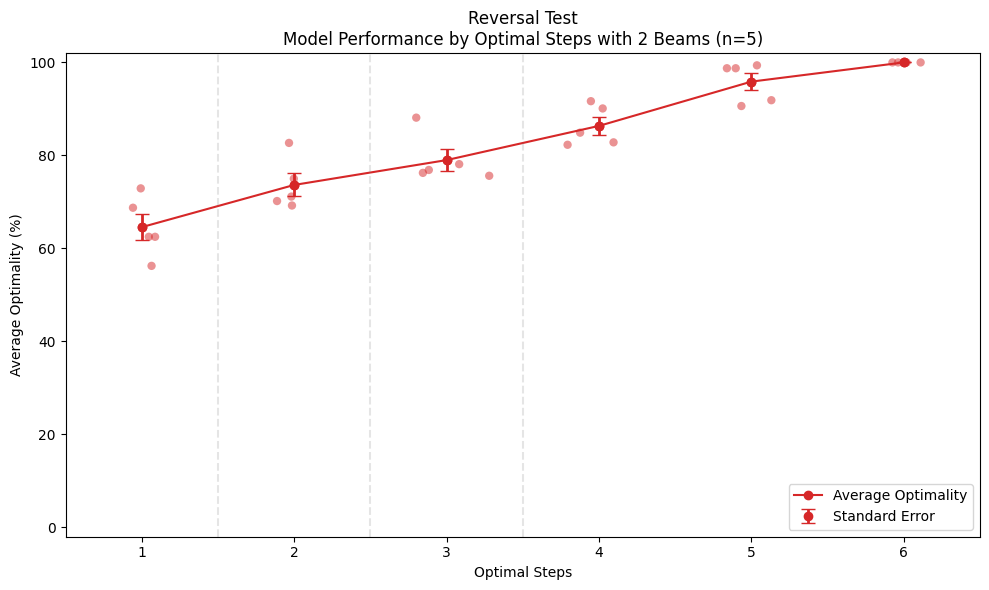

In [28]:
test = "reversal"
num_beams = 2
size = 4

# Parent folder name
parent_folder = "reversal_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'optimal_steps' and calculate the percentage of optimal outputs
    grouped = df.groupby('optimal_steps')['optimality'].agg(
        average_optimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('optimal_steps')['average_optimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['optimal_steps'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Optimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['optimal_steps'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['optimal_steps']:
    data_points = summary_df[summary_df['optimal_steps'] == step]['average_optimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Reversal Test\nModel Performance by Optimal Steps with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Optimal Steps')
plt.ylabel('Average Optimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['optimal_steps'].min()
max_optimal_steps = grouped_stats['optimal_steps'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_performance_plot.png')
plt.savefig(save_path)
plt.show()

##### Reversal test individual model output plots

In [ ]:
test_name = "Reversal Test"
test = "reversal"
num_beams = 2
parent_folder = "reversal_test"
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

selected_grid = "1"
selected_file = f"{directory_name}/{test}_{num_beams}beams_grid_{selected_grid}.csv"

# Call the function with the specific file path
plot_all_grid_files(selected_file, 'path')

Processing file: reversal_test/reversal_test_2beams/reversal_2beams_grid_1.csv, row 1: [[(0, 0), (0, 1)]]
Processing file: reversal_test/reversal_test_2beams/reversal_2beams_grid_1.csv, row 2: [[(0, 0), (0, 1), (0, 2)]]
Processing file: reversal_test/reversal_test_2beams/reversal_2beams_grid_1.csv, row 3: [[(0, 0), (0, 1), (0, 2), (0, 3)]]
Processing file: reversal_test/reversal_test_2beams/reversal_2beams_grid_1.csv, row 4: [[(0, 0), (1, 0)]]
Processing file: reversal_test/reversal_test_2beams/reversal_2beams_grid_1.csv, row 5: [[(0, 0), (1, 0), (1, 1)]]
Processing file: reversal_test/reversal_test_2beams/reversal_2beams_grid_1.csv, row 6: [[(0, 0), (0, 1), (1, 1)]]
Processing file: reversal_test/reversal_test_2beams/reversal_2beams_grid_1.csv, row 7: [[(0, 0), (0, 1), (1, 1), (1, 2)]]
Processing file: reversal_test/reversal_test_2beams/reversal_2beams_grid_1.csv, row 8: [[(0, 0), (0, 1), (0, 2), (1, 2)]]
Processing file: reversal_test/reversal_test_2beams/reversal_2beams_grid_1.csv, 

#### Reverse path joining test

In [ ]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

# Remember to load model with the desired hyperparameters before running this test!
size = 3  # Size (in terms of length) of the grid
test = "reverse_path_joining"
num_grids = 30 # Number random grids to be tested

# Parent folder name
parent_folder = "reverse_path_joining_test"

# Define folder name
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# Generate all start-end combinations for the grid
start_end_permutations = generate_start_end_permutations(size)

# Create DataFrame
start_end = pd.DataFrame(start_end_permutations, columns=['start', 'end'])

# Generate all possible optimal paths for given start-end combinations
path_permutation = generate_path_permutations(start_end)

# Generate all possible path segment combinations for given optimal paths
path_permutation = generate_path_joining_permutations(path_permutation)

# Only retain the uppermost row for any duplicated path segment combinations
path_permutation = path_permutation.drop_duplicates(subset='connected_segments', keep='first')

# Create folder if the directory does not exist
if not os.path.exists(directory_name):
    # Create the directory
    os.makedirs(directory_name)

for n in range(num_grids):

    # Free unused memory
    torch.cuda.empty_cache()
    gc.collect()

    # Generate a random grid of nouns
    nouns = set()
    while len(nouns) < size*size:
        word = Random_Word.word(include_parts_of_speech=["nouns"]).replace(" ", "_")
        nouns.add(word)
    nouns = list(nouns)

    # Generate grid from grid of nounds
    grid = create_unique_random_grid(nouns, size)

    path_permutations = path_permutation.copy()

    # Apply the generate_path_string function to each row in the DataFrame
    path_permutations['path_string'] = path_permutations['connected_segments'].apply(lambda x: generate_shortest_path_joining_string(grid, x))

    # Apply the adjusted append_target_path function to each row in the DataFrame
    path_permutations['input_prompt'] = path_permutations.apply(
        lambda row: reversal_append_target_path(
            row['path_string'],
            row['start'],
            row['end'],
            grid
        ),
        axis=1
    )

    # Batch generation of model outputs for the input prompts
    model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist(), batch_size)
    path_permutations['output'] = model_outputs

    # Serial generation of model outputs for the input prompts
    #model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist())
    #path_permutations['output'] = model_outputs

    # Apply the adjusted calculate_path_index function to each row in the DataFrame
    path_permutations['num_input'] = path_permutations['path_string'].apply(lambda x: calculate_path_index(x))

    # Apply the adjusted extract_path function to each row in the DataFrame
    path_permutations['extracted_output'] = path_permutations.apply(
        lambda row: extract_path(
            row['num_input'],
            row['output']
        ),
        axis=1
    )

    # Apply the adjusted path_to_coords function to each row in the DataFrame
    path_permutations['output_coords'] = path_permutations.apply(
        lambda row: direction_to_coords(
            row['extracted_output'],
            row['end'],
        ),
        axis=1
    )

    # Apply the adjusted calculate_optimal_steps function to each row in the DataFrame
    path_permutations['optimal_steps'] = path_permutations.apply(
        lambda row: calculate_optimal_steps(
            row['start'],
            row['end']
        ),
        axis=1
    )

    # Apply the adjusted calculate_generated_steps function to each row in the DataFrame
    path_permutations['generated_steps'] = path_permutations['output_coords'].apply(lambda x: calculate_generated_steps(x))

    # Check if the generated path is optimal for each row
    path_permutations['optimal_num_steps'] = path_permutations['optimal_steps'] == path_permutations['generated_steps']

    # Check if the extracted start and end points are same as the target start and end points
    path_permutations['start_end_validity'] = path_permutations.apply(
        lambda row: row['output_coords'][0] == row['end'] and row['output_coords'][-1] == row['start'],
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['optimality'] = path_permutations.apply(
        lambda row: all([row['optimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # write grid into path_permutations
    path_permutations['grid'] = [grid] * len(path_permutations)

    # Save the DataFrame to a CSV file
    save_path = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_{n+1}.csv')
    path_permutations.to_csv(save_path, index=False)

##### Reverse path joining test evaluation and performance plot

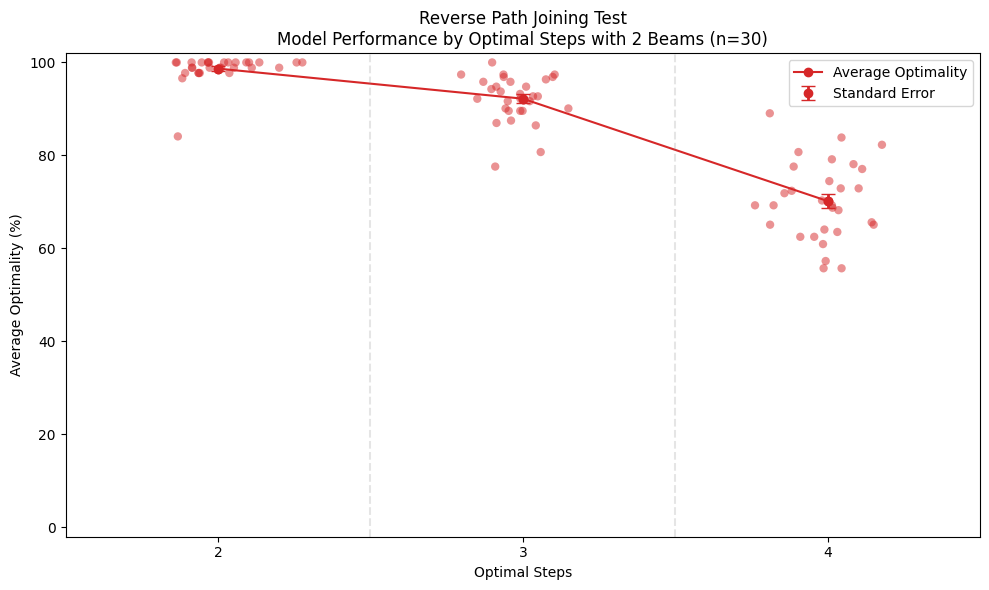

In [ ]:
test = "reverse_path_joining"
num_beams = 2
size = 3

# Parent folder name
parent_folder = "reverse_path_joining_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'optimal_steps' and calculate the percentage of optimal outputs
    grouped = df.groupby('optimal_steps')['optimality'].agg(
        average_optimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('optimal_steps')['average_optimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['optimal_steps'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Optimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['optimal_steps'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['optimal_steps']:
    data_points = summary_df[summary_df['optimal_steps'] == step]['average_optimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Reverse Path Joining Test\nModel Performance by Optimal Steps with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Optimal Steps')
plt.ylabel('Average Optimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['optimal_steps'].min()
max_optimal_steps = grouped_stats['optimal_steps'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_performance_plot.png')
plt.savefig(save_path)
plt.show()

##### Reverse path joining test individual model output plots

In [ ]:
test_name = "Reverse Path Joining Test"
test = "reverse_path_joining"
num_beams = 2
parent_folder = "reverse_path_joining_test"
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

selected_grid = "1"
selected_file = f"{directory_name}/{test}_{num_beams}beams_grid_{selected_grid}.csv"

# Call the function with the specific file path
plot_all_grid_files(selected_file, 'connected_segments')

Processing file: reverse_path_joining_test/reverse_path_joining_test_2beams/reverse_path_joining_2beams_grid_1.csv, row 1: [[(0, 0), (0, 1)], [(0, 1), (0, 2)]]
Processing file: reverse_path_joining_test/reverse_path_joining_test_2beams/reverse_path_joining_2beams_grid_1.csv, row 2: [[(0, 0), (0, 1), (0, 2)]]
Processing file: reverse_path_joining_test/reverse_path_joining_test_2beams/reverse_path_joining_2beams_grid_1.csv, row 3: [[(0, 0), (0, 1)], [(0, 1), (0, 2), (0, 3)]]
Processing file: reverse_path_joining_test/reverse_path_joining_test_2beams/reverse_path_joining_2beams_grid_1.csv, row 4: [[(0, 0), (0, 1), (0, 2)], [(0, 2), (0, 3)]]
Processing file: reverse_path_joining_test/reverse_path_joining_test_2beams/reverse_path_joining_2beams_grid_1.csv, row 5: [[(0, 0), (0, 1), (0, 2), (0, 3)]]
Processing file: reverse_path_joining_test/reverse_path_joining_test_2beams/reverse_path_joining_2beams_grid_1.csv, row 6: [[(0, 0), (0, 1)], [(0, 1), (0, 2)], [(0, 2), (0, 3)]]
Processing file: r

#### Hamiltonian suboptimal path test

In [ ]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

4272

In [ ]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

# Remember to load model with the desired hyperparameters before running this test!
size = 3  # Size (in terms of length) of the grid
test = "hamiltonian_suboptimal"
num_grids = 30 # Number random grids to be tested

# Parent folder name
parent_folder = "hamiltonian_suboptimal_test"

# Define folder name
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

hamiltonian_paths = generate_hamiltonian_paths(size)

# Create an empty DataFrame
path_permutation = pd.DataFrame(columns=['path'])

# Write all Hamiltonian paths to the DataFrame
path_permutation['path'] = hamiltonian_paths

# Write start and end locations according to the first and last location of each Hamiltonian path
path_permutation['start'] = path_permutation['path'].apply(lambda x: x[0])
path_permutation['end'] = path_permutation['path'].apply(lambda x: x[-1])

# Create folder if the directory does not exist
if not os.path.exists(directory_name):
    # Create the directory
    os.makedirs(directory_name)

for n in range(num_grids):

    torch.cuda.empty_cache()
    gc.collect()

    # Generate a random grid of nouns
    nouns = set()
    while len(nouns) < size*size:
        word = Random_Word.word(include_parts_of_speech=["nouns"]).replace(" ", "_")
        nouns.add(word)
    nouns = list(nouns)

    # Generate grid from the set of nounds
    grid = create_unique_random_grid(nouns, size)

    path_permutations = path_permutation.copy()

    # Apply the generate_path_string function to each row in the DataFrame
    path_permutations['path_string'] = path_permutations['path'].apply(lambda x: generate_foraging_path_string(grid, x))

    # Apply the adjusted append_target_path function to each row in the DataFrame
    path_permutations['input_prompt'] = path_permutations.apply(
        lambda row: copy_paste_append_target_path(
            row['path_string'],
            row['start'],
            row['end'],
            grid
        ),
        axis=1
    )

    # Batch generation of model outputs for the input prompts
    model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist(), batch_size)
    path_permutations['output'] = model_outputs

    # Serial generation of model outputs for the input prompts
    #model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist())
    #path_permutations['output'] = model_outputs

    # Apply the adjusted calculate_path_index function to each row in the DataFrame
    path_permutations['num_input'] = path_permutations['path_string'].apply(lambda x: calculate_path_index(x))

    # Apply the adjusted extract_path function to each row in the DataFrame
    path_permutations['extracted_output'] = path_permutations.apply(
        lambda row: extract_path(
            row['num_input'],
            row['output']
        ),
        axis=1
    )

    # Apply the adjusted path_to_coords function to each row in the DataFrame
    path_permutations['output_coords'] = path_permutations.apply(
        lambda row: direction_to_coords(
            row['extracted_output'],
            row['start'],
        ),
        axis=1
    )

    # Apply the adjusted calculate_optimal_steps function to each row in the DataFrame
    path_permutations['optimal_steps'] = path_permutations.apply(
        lambda row: calculate_optimal_steps(
            row['start'],
            row['end']
        ),
        axis=1
    )

    # Apply the adjusted calculate_generated_steps function to each row in the DataFrame
    path_permutations['generated_steps'] = path_permutations['output_coords'].apply(lambda x: calculate_generated_steps(x))

    # Check if the generated path is optimal for each row
    path_permutations['optimal_num_steps'] = path_permutations['optimal_steps'] == path_permutations['generated_steps']

    # Check if the extracted start and end points are same as the target start and end points
    path_permutations['start_end_validity'] = path_permutations.apply(
        lambda row: row['output_coords'][0] == row['start'] and row['output_coords'][-1] == row['end'],
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['optimality'] = path_permutations.apply(
        lambda row: all([row['optimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # write grid into path_permutations
    path_permutations['grid'] = [grid] * len(path_permutations)

    # Save the DataFrame to a CSV file
    save_path = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_{n+1}.csv')
    path_permutations.to_csv(save_path, index=False)

##### Hamiltonian suboptimal path test evaluation and performance plot

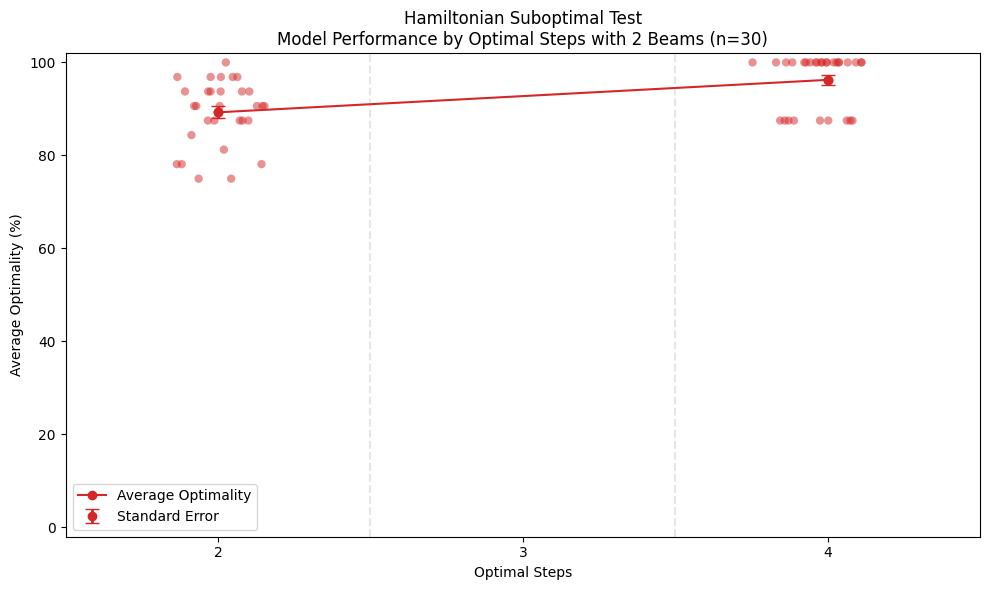

In [ ]:
test = "hamiltonian_suboptimal"
num_beams = 2
size = 3

# Parent folder name
parent_folder = "hamiltonian_suboptimal_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'optimal_steps' and calculate the percentage of optimal outputs
    grouped = df.groupby('optimal_steps')['optimality'].agg(
        average_optimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('optimal_steps')['average_optimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['optimal_steps'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Optimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['optimal_steps'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['optimal_steps']:
    data_points = summary_df[summary_df['optimal_steps'] == step]['average_optimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Hamiltonian Suboptimal Test\nModel Performance by Optimal Steps with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Optimal Steps')
plt.ylabel('Average Optimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['optimal_steps'].min()
max_optimal_steps = grouped_stats['optimal_steps'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_performance_plot.png')
plt.savefig(save_path)
plt.show()

##### Hamiltonian suboptimal path test individual model output plots

In [ ]:
test_name = "Hamiltonian Suboptimal Path Test"
test = "hamiltonian_suboptimal"
num_beams = 2
parent_folder = "hamiltonian_suboptimal_test"
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

selected_grid = "1"
selected_file = f"{directory_name}/{test}_{num_beams}beams_grid_{selected_grid}.csv"

# Call the function with the specific file path
plot_all_grid_files(selected_file, 'path')

Processing file: hamiltonian_suboptimal_test/hamiltonian_suboptimal_test_2beams/hamiltonian_suboptimal_2beams_grid_1.csv, row 1: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (1, 2), (2, 2), (3, 2), (3, 3), (2, 3), (1, 3), (0, 3)]]
Processing file: hamiltonian_suboptimal_test/hamiltonian_suboptimal_test_2beams/hamiltonian_suboptimal_2beams_grid_1.csv, row 2: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (0, 3), (1, 3), (2, 3), (3, 3), (3, 2), (2, 2), (1, 2)]]
Processing file: hamiltonian_suboptimal_test/hamiltonian_suboptimal_test_2beams/hamiltonian_suboptimal_2beams_grid_1.csv, row 3: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (0, 3), (1, 3), (1, 2), (2, 2), (3, 2), (3, 3), (2, 3)]]
Processing file: hamiltonian_suboptimal_test/hamiltonian_suboptimal_test_2beams/hamiltonian_suboptimal_2beams_grid_1.csv, row 4: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (0, 3), (1, 3), (

#### Hamiltonian optimal segments test

In [ ]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

4004

In [ ]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

# Remember to load model with the desired hyperparameters before running this test!
size = 3  # Size (in terms of length) of the grid
test = "hamiltonian_optimal_segments"
num_grids = 30 # Number random grids to be tested

# Parent folder name
parent_folder = "hamiltonian_optimal_segments_test"

# Define folder name
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

hamiltonian_paths = generate_hamiltonian_paths(size)

# Create an empty DataFrame
path_permutation = pd.DataFrame(columns=['path'])

# Write all Hamiltonian paths to the DataFrame
path_permutation['path'] = hamiltonian_paths

# Write start and end locations according to the first and last location of each Hamiltonian path
path_permutation['start'] = path_permutation['path'].apply(lambda x: x[0])
path_permutation['end'] = path_permutation['path'].apply(lambda x: x[-1])

# Apply the connected_optimal_segments function to each row in the DataFrame
path_permutation['connected_segments'] = path_permutation['path'].apply(connected_optimal_segments)

# Create folder if the directory does not exist
if not os.path.exists(directory_name):
    # Create the directory
    os.makedirs(directory_name)

for n in range(num_grids):

    torch.cuda.empty_cache()
    gc.collect()

    # Generate a random grid of nouns
    nouns = set()
    while len(nouns) < size*size:
        word = Random_Word.word(include_parts_of_speech=["nouns"]).replace(" ", "_")
        nouns.add(word)
    nouns = list(nouns)

    # Generate grid from grid of nounds
    grid = create_unique_random_grid(nouns, size)

    path_permutations = path_permutation.copy()

    # Apply the generate_path_string function to each row in the DataFrame
    path_permutations['path_string'] = path_permutations['connected_segments'].apply(lambda x: generate_shortest_path_joining_string(grid, x))

    # Apply the adjusted append_target_path function to each row in the DataFrame
    path_permutations['input_prompt'] = path_permutations.apply(
        lambda row: copy_paste_append_target_path(
            row['path_string'],
            row['start'],
            row['end'],
            grid
        ),
        axis=1
    )

    # Batch generation of model outputs for the input prompts
    model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist(), batch_size)
    path_permutations['output'] = model_outputs

    # Serial generation of model outputs for the input prompts
    #model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist())
    #path_permutations['output'] = model_outputs

    # Apply the adjusted calculate_path_index function to each row in the DataFrame
    path_permutations['num_input'] = path_permutations['path_string'].apply(lambda x: calculate_path_index(x))

    # Apply the adjusted extract_path function to each row in the DataFrame
    path_permutations['extracted_output'] = path_permutations.apply(
        lambda row: extract_path(
            row['num_input'],
            row['output']
        ),
        axis=1
    )

    # Apply the adjusted path_to_coords function to each row in the DataFrame
    path_permutations['output_coords'] = path_permutations.apply(
        lambda row: direction_to_coords(
            row['extracted_output'],
            row['start'],
        ),
        axis=1
    )

    # Apply the adjusted calculate_optimal_steps function to each row in the DataFrame
    path_permutations['optimal_steps'] = path_permutations.apply(
        lambda row: calculate_optimal_steps(
            row['start'],
            row['end']
        ),
        axis=1
    )

    # Apply the adjusted calculate_generated_steps function to each row in the DataFrame
    path_permutations['generated_steps'] = path_permutations['output_coords'].apply(lambda x: calculate_generated_steps(x))

    # Check if the generated path is optimal for each row
    path_permutations['optimal_num_steps'] = path_permutations['optimal_steps'] == path_permutations['generated_steps']

    # Check if the extracted start and end points are same as the target start and end points
    path_permutations['start_end_validity'] = path_permutations.apply(
        lambda row: row['output_coords'][0] == row['start'] and row['output_coords'][-1] == row['end'],
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['optimality'] = path_permutations.apply(
        lambda row: all([row['optimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # write grid into path_permutations
    path_permutations['grid'] = [grid] * len(path_permutations)

    # Save the DataFrame to a CSV file
    save_path = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_{n+1}.csv')
    path_permutations.to_csv(save_path, index=False)

##### Hamiltonian optimal segments test evaluation and performance plot

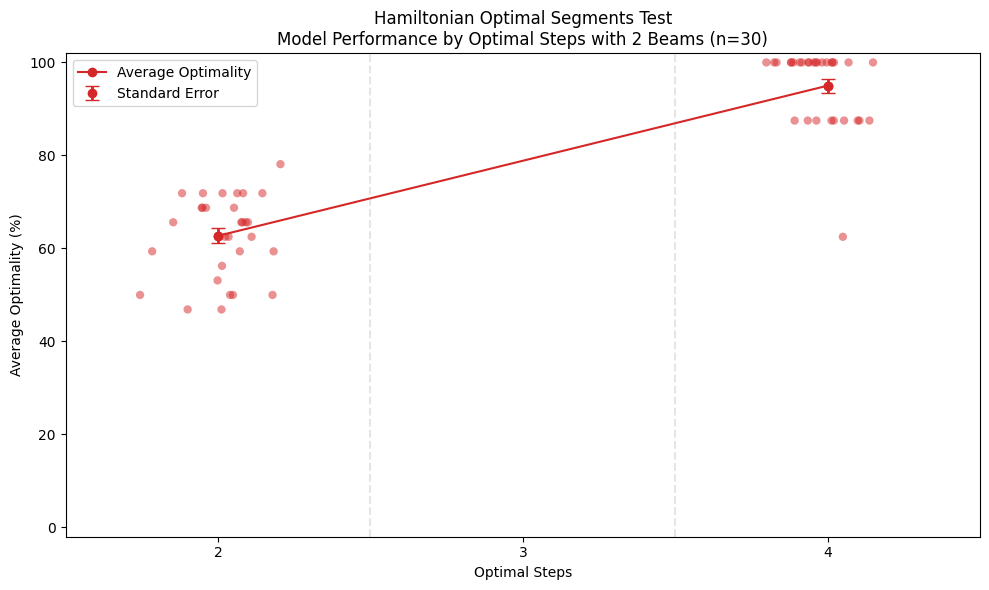

In [ ]:
test = "hamiltonian_optimal_segments"
num_beams = 2
size = 3

# Parent folder name
parent_folder = "hamiltonian_optimal_segments_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'optimal_steps' and calculate the percentage of optimal outputs
    grouped = df.groupby('optimal_steps')['optimality'].agg(
        average_optimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('optimal_steps')['average_optimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['optimal_steps'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Optimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['optimal_steps'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['optimal_steps']:
    data_points = summary_df[summary_df['optimal_steps'] == step]['average_optimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Hamiltonian Optimal Segments Test\nModel Performance by Optimal Steps with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Optimal Steps')
plt.ylabel('Average Optimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['optimal_steps'].min()
max_optimal_steps = grouped_stats['optimal_steps'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_performance_plot.png')
plt.savefig(save_path)
plt.show()

##### Hamiltonian optimal segments test individual model output plots

In [ ]:
test_name = "Hamiltonian Optimal Segments Test"
test = "hamiltonian_optimal_segments"
num_beams = 2
parent_folder = "hamiltonian_optimal_segments_test"
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

selected_grid = "1"
selected_file = f"{directory_name}/{test}_{num_beams}beams_grid_{selected_grid}.csv"

# Call the function with the specific file path
plot_all_grid_files(selected_file, 'connected_segments')

Processing file: hamiltonian_optimal_segments_test/hamiltonian_optimal_segments_test_2beams/hamiltonian_optimal_segments_2beams_grid_1.csv, row 1: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1)], [(3, 1), (2, 1), (1, 1), (0, 1), (0, 2)], [(0, 2), (1, 2), (2, 2), (3, 2), (3, 3)], [(3, 3), (2, 3), (1, 3), (0, 3)]]
Processing file: hamiltonian_optimal_segments_test/hamiltonian_optimal_segments_test_2beams/hamiltonian_optimal_segments_2beams_grid_1.csv, row 2: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1)], [(3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (0, 3)], [(0, 3), (1, 3), (2, 3), (3, 3), (3, 2)], [(3, 2), (2, 2), (1, 2)]]
Processing file: hamiltonian_optimal_segments_test/hamiltonian_optimal_segments_test_2beams/hamiltonian_optimal_segments_2beams_grid_1.csv, row 3: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1)], [(3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (0, 3)], [(0, 3), (1, 3), (1, 2), (2, 2), (3, 2)], [(3, 2), (3, 3), (2, 3)]]
Processing file: hamiltonian_optimal_segments_test/hamiltonian_optimal_segme

#### Hamiltonian suboptimal foraging test

In [ ]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

# Remember to load model with the desired hyperparameters before running this test!
size = 3  # Size (in terms of length) of the grid
test = "hamiltonian_suboptimal_foraging"
num_grids = 30 # Number random grids to be tested

# Parent folder name
parent_folder = "hamiltonian_suboptimal_foraging_test"

# Define folder name
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

hamiltonian_paths = generate_hamiltonian_paths(size)

# Create an empty DataFrame
path_permutation = pd.DataFrame(columns=['path'])

# Write all Hamiltonian paths to the DataFrame
path_permutation['path'] = hamiltonian_paths

# Write start and end locations according to the first and last location of each Hamiltonian path
path_permutation['start'] = path_permutation['path'].apply(lambda x: x[0])
path_permutation['end'] = path_permutation['path'].apply(lambda x: x[-1])

# Create folder if the directory does not exist
if not os.path.exists(directory_name):
    # Create the directory
    os.makedirs(directory_name)

for n in range(num_grids):

    torch.cuda.empty_cache()
    gc.collect()

    # Generate a random grid of nouns
    nouns = set()
    while len(nouns) < size*size:
        word = Random_Word.word(include_parts_of_speech=["nouns"]).replace(" ", "_")
        nouns.add(word)
    nouns = list(nouns)

    # Generate grid from the set of nounds
    grid = create_unique_random_grid(nouns, size)

    path_permutations = path_permutation.copy()

    # Apply the generate_path_string function to each row in the DataFrame
    path_permutations['path_string'] = path_permutations['path'].apply(lambda x: generate_foraging_path_string(grid, x))

    # Apply the adjusted append_target_path function to each row in the DataFrame
    path_permutations['input_prompt'] = path_permutations.apply(
        lambda row: copy_paste_foraging_append_target_path(
            row['path_string'],
            row['start'],
            row['end'],
            grid
        ),
        axis=1
    )

    # Batch generation of model outputs for the input prompts
    model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist(), batch_size)
    path_permutations['output'] = model_outputs

    # Serial generation of model outputs for the input prompts
    #model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist())
    #path_permutations['output'] = model_outputs

    # Apply the adjusted calculate_path_index function to each row in the DataFrame
    path_permutations['num_input'] = path_permutations['path_string'].apply(lambda x: calculate_path_index(x))

    # Apply the adjusted extract_path function to each row in the DataFrame
    path_permutations['extracted_output'] = path_permutations.apply(
        lambda row: extract_path(
            row['num_input'],
            row['output']
        ),
        axis=1
    )

    # Apply the adjusted path_to_coords function to each row in the DataFrame
    path_permutations['output_coords'] = path_permutations.apply(
        lambda row: direction_to_coords(
            row['extracted_output'],
            row['start'],
        ),
        axis=1
    )

    # Apply the adjusted calculate_optimal_steps function to each row in the DataFrame
    path_permutations['optimal_steps'] = path_permutations.apply(
        lambda row: calculate_optimal_steps(
            row['start'],
            row['end']
        ),
        axis=1
    )

    # Apply the adjusted calculate_generated_steps function to each row in the DataFrame
    path_permutations['generated_steps'] = path_permutations['output_coords'].apply(lambda x: calculate_generated_steps(x))

    # Check if the generated path is optimal for each row
    path_permutations['optimal_num_steps'] = path_permutations['optimal_steps'] == path_permutations['generated_steps']

    # Check if the generated path is suboptimal for each row (ie. larger than the optimal number of steps)
    path_permutations['suboptimal_num_steps'] = path_permutations['generated_steps'] > path_permutations['optimal_steps']

    # Check if the extracted start and end points are same as the target start and end points
    path_permutations['start_end_validity'] = path_permutations.apply(
        lambda row: row['output_coords'][0] == row['start'] and row['output_coords'][-1] == row['end'],
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['optimality'] = path_permutations.apply(
        lambda row: all([row['optimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['suboptimality'] = path_permutations.apply(
        lambda row: all([row['suboptimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # write grid into path_permutations
    path_permutations['grid'] = [grid] * len(path_permutations)

    # Save the DataFrame to a CSV file
    save_path = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_{n+1}.csv')
    path_permutations.to_csv(save_path, index=False)

##### Hamiltonian suboptimal foraging test evaluation and performance plot

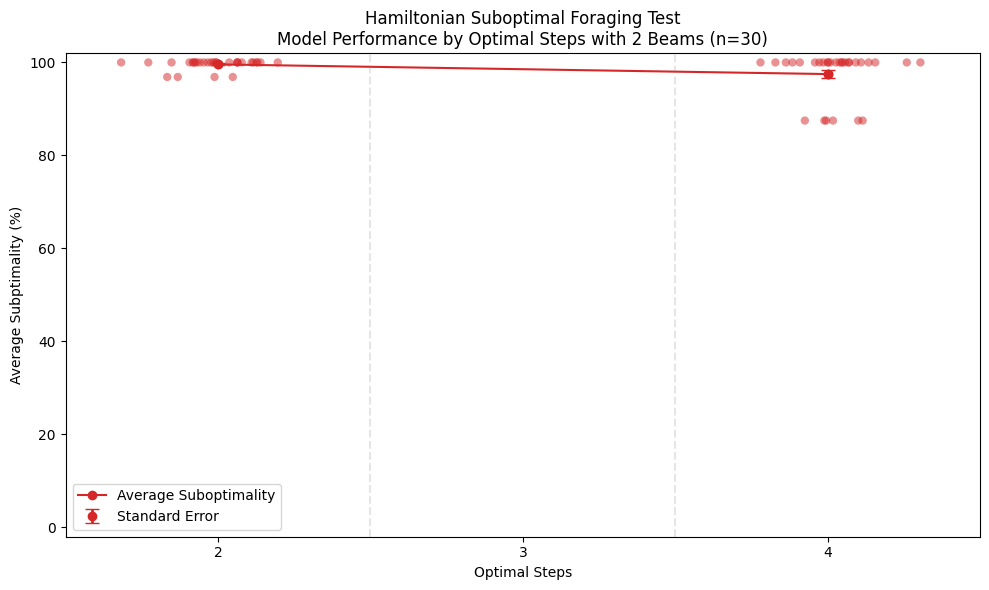

In [ ]:
test = "hamiltonian_suboptimal_foraging"
num_beams = 2
size = 3

# Parent folder name
parent_folder = "hamiltonian_suboptimal_foraging_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'optimal_steps' and calculate the percentage of optimal outputs
    grouped = df.groupby('optimal_steps')['suboptimality'].agg(
        average_suboptimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_suboptimal_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('optimal_steps')['average_suboptimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['optimal_steps'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Suboptimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['optimal_steps'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['optimal_steps']:
    data_points = summary_df[summary_df['optimal_steps'] == step]['average_suboptimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Hamiltonian Suboptimal Foraging Test\nModel Performance by Optimal Steps with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Optimal Steps')
plt.ylabel('Average Subptimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['optimal_steps'].min()
max_optimal_steps = grouped_stats['optimal_steps'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_suboptimal_performance_plot.png')
plt.savefig(save_path)
plt.show()

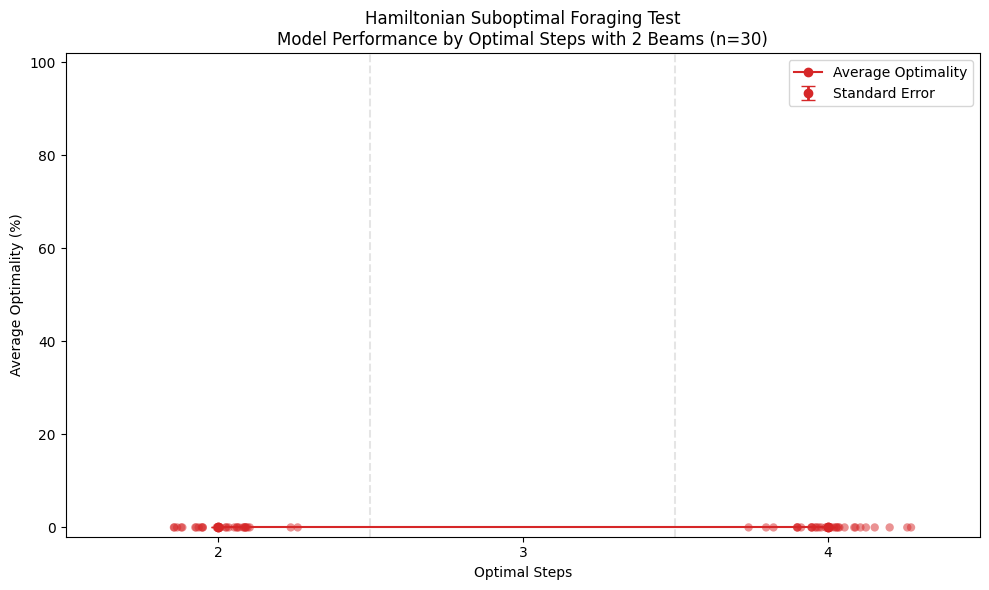

In [ ]:
test = "hamiltonian_suboptimal_foraging"
num_beams = 2
size = 3

# Parent folder name
parent_folder = "hamiltonian_suboptimal_foraging_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'optimal_steps' and calculate the percentage of optimal outputs
    grouped = df.groupby('optimal_steps')['optimality'].agg(
        average_optimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_optimal_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('optimal_steps')['average_optimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['optimal_steps'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Optimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['optimal_steps'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['optimal_steps']:
    data_points = summary_df[summary_df['optimal_steps'] == step]['average_optimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Hamiltonian Suboptimal Foraging Test\nModel Performance by Optimal Steps with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Optimal Steps')
plt.ylabel('Average Optimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['optimal_steps'].min()
max_optimal_steps = grouped_stats['optimal_steps'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_optimal_performance_plot.png')
plt.savefig(save_path)
plt.show()

##### Hamiltonian suboptimal foraging test individual model output plots

In [ ]:
test_name = "Hamiltonian Suboptimal Foraging Test"
test = "hamiltonian_suboptimal_foraging"
num_beams = 2
parent_folder = "hamiltonian_suboptimal_foraging_test"
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

selected_grid = "1"
selected_file = f"{directory_name}/{test}_{num_beams}beams_grid_{selected_grid}.csv"

# Call the function with the specific file path
plot_all_grid_files(selected_file, 'path')

Processing file: hamiltonian_suboptimal_foraging_test/hamiltonian_suboptimal_foraging_test_2beams/hamiltonian_suboptimal_foraging_2beams_grid_1.csv, row 1: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (1, 2), (2, 2), (3, 2), (3, 3), (2, 3), (1, 3), (0, 3)]]
Processing file: hamiltonian_suboptimal_foraging_test/hamiltonian_suboptimal_foraging_test_2beams/hamiltonian_suboptimal_foraging_2beams_grid_1.csv, row 2: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (0, 3), (1, 3), (2, 3), (3, 3), (3, 2), (2, 2), (1, 2)]]
Processing file: hamiltonian_suboptimal_foraging_test/hamiltonian_suboptimal_foraging_test_2beams/hamiltonian_suboptimal_foraging_2beams_grid_1.csv, row 3: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (0, 3), (1, 3), (1, 2), (2, 2), (3, 2), (3, 3), (2, 3)]]
Processing file: hamiltonian_suboptimal_foraging_test/hamiltonian_suboptimal_foraging_test_2beams/hamiltonian_suboptimal_foraging_2beams_gr

#### Hamiltonian optimal segments foraging test

In [ ]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

# Remember to load model with the desired hyperparameters before running this test!
size = 3  # Size (in terms of length) of the grid
test = "hamiltonian_optimal_segments_foraging"
num_grids = 30 # Number random grids to be tested

# Parent folder name
parent_folder = "hamiltonian_optimal_segments_foraging_test"

# Define folder name
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

hamiltonian_paths = generate_hamiltonian_paths(size)

# Create an empty DataFrame
path_permutation = pd.DataFrame(columns=['path'])

# Write all Hamiltonian paths to the DataFrame
path_permutation['path'] = hamiltonian_paths

# Write start and end locations according to the first and last location of each Hamiltonian path
path_permutation['start'] = path_permutation['path'].apply(lambda x: x[0])
path_permutation['end'] = path_permutation['path'].apply(lambda x: x[-1])

# Apply the connected_optimal_segments function to each row in the DataFrame
path_permutation['connected_segments'] = path_permutation['path'].apply(connected_optimal_segments)

# Create folder if the directory does not exist
if not os.path.exists(directory_name):
    # Create the directory
    os.makedirs(directory_name)

for n in range(num_grids):

    torch.cuda.empty_cache()
    gc.collect()

    # Generate a random grid of nouns
    nouns = set()
    while len(nouns) < size*size:
        word = Random_Word.word(include_parts_of_speech=["nouns"]).replace(" ", "_")
        nouns.add(word)
    nouns = list(nouns)

    # Generate grid from grid of nounds
    grid = create_unique_random_grid(nouns, size)

    path_permutations = path_permutation.copy()

    # Apply the generate_path_string function to each row in the DataFrame
    path_permutations['path_string'] = path_permutations['connected_segments'].apply(lambda x: generate_shortest_path_joining_string(grid, x))

    # Apply the adjusted append_target_path function to each row in the DataFrame
    path_permutations['input_prompt'] = path_permutations.apply(
        lambda row: copy_paste_foraging_append_target_path(
            row['path_string'],
            row['start'],
            row['end'],
            grid
        ),
        axis=1
    )

    # Batch generation of model outputs for the input prompts
    model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist(), batch_size)
    path_permutations['output'] = model_outputs

    # Serial generation of model outputs for the input prompts
    #model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist())
    #path_permutations['output'] = model_outputs

    # Apply the adjusted calculate_path_index function to each row in the DataFrame
    path_permutations['num_input'] = path_permutations['path_string'].apply(lambda x: calculate_path_index(x))

    # Apply the adjusted extract_path function to each row in the DataFrame
    path_permutations['extracted_output'] = path_permutations.apply(
        lambda row: extract_path(
            row['num_input'],
            row['output']
        ),
        axis=1
    )

    # Apply the adjusted path_to_coords function to each row in the DataFrame
    path_permutations['output_coords'] = path_permutations.apply(
        lambda row: direction_to_coords(
            row['extracted_output'],
            row['start'],
        ),
        axis=1
    )

    # Apply the adjusted calculate_optimal_steps function to each row in the DataFrame
    path_permutations['optimal_steps'] = path_permutations.apply(
        lambda row: calculate_optimal_steps(
            row['start'],
            row['end']
        ),
        axis=1
    )

    # Apply the adjusted calculate_generated_steps function to each row in the DataFrame
    path_permutations['generated_steps'] = path_permutations['output_coords'].apply(lambda x: calculate_generated_steps(x))

    # Check if the generated path is optimal for each row
    path_permutations['optimal_num_steps'] = path_permutations['optimal_steps'] == path_permutations['generated_steps']

    # Check if the generated path is suboptimal for each row (ie. larger than the optimal number of steps)
    path_permutations['suboptimal_num_steps'] = path_permutations['generated_steps'] > path_permutations['optimal_steps']

    # Check if the extracted start and end points are same as the target start and end points
    path_permutations['start_end_validity'] = path_permutations.apply(
        lambda row: row['output_coords'][0] == row['start'] and row['output_coords'][-1] == row['end'],
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['optimality'] = path_permutations.apply(
        lambda row: all([row['optimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['suboptimality'] = path_permutations.apply(
        lambda row: all([row['suboptimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # write grid into path_permutations
    path_permutations['grid'] = [grid] * len(path_permutations)

    # Save the DataFrame to a CSV file
    save_path = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_{n+1}.csv')
    path_permutations.to_csv(save_path, index=False)

##### Hamiltonian optimal segments foraging test evaluation and performance plot

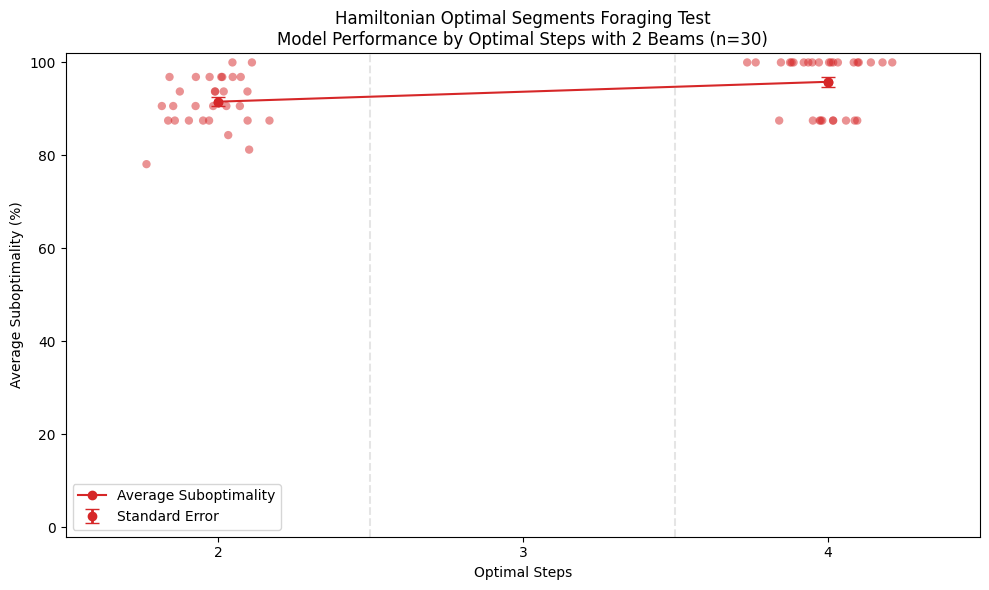

In [ ]:
test = "hamiltonian_optimal_segments_foraging"
num_beams = 2
size = 3

# Parent folder name
parent_folder = "hamiltonian_optimal_segments_foraging_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'optimal_steps' and calculate the percentage of optimal outputs
    grouped = df.groupby('optimal_steps')['suboptimality'].agg(
        average_suboptimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_suboptimal_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('optimal_steps')['average_suboptimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['optimal_steps'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Suboptimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['optimal_steps'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['optimal_steps']:
    data_points = summary_df[summary_df['optimal_steps'] == step]['average_suboptimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Hamiltonian Optimal Segments Foraging Test\nModel Performance by Optimal Steps with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Optimal Steps')
plt.ylabel('Average Suboptimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['optimal_steps'].min()
max_optimal_steps = grouped_stats['optimal_steps'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_suboptimal_performance_plot.png')
plt.savefig(save_path)
plt.show()

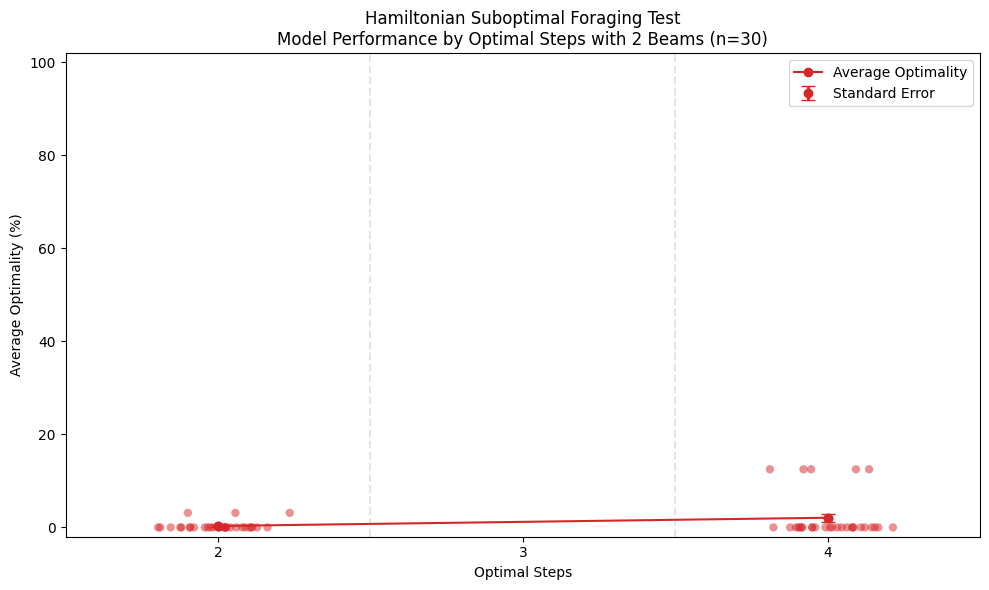

In [ ]:
test = "hamiltonian_optimal_segments_foraging"
num_beams = 2
size = 4

# Parent folder name
parent_folder = "hamiltonian_optimal_segments_foraging_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'optimal_steps' and calculate the percentage of optimal outputs
    grouped = df.groupby('optimal_steps')['optimality'].agg(
        average_optimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_optimal_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('optimal_steps')['average_optimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['optimal_steps'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Optimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['optimal_steps'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['optimal_steps']:
    data_points = summary_df[summary_df['optimal_steps'] == step]['average_optimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Hamiltonian Suboptimal Foraging Test\nModel Performance by Optimal Steps with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Optimal Steps')
plt.ylabel('Average Optimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['optimal_steps'].min()
max_optimal_steps = grouped_stats['optimal_steps'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_optimal_performance_plot.png')
plt.savefig(save_path)
plt.show()

##### Hamiltonian optimal segments foraging test individual model output plots

In [ ]:
test_name = "Hamiltonian Optimal Segments Foraging Test"
test = "hamiltonian_optimal_segments_foraging"
num_beams = 2
parent_folder = "hamiltonian_optimal_segments_foraging_test"
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

selected_grid = "1"
selected_file = f"{directory_name}/{test}_{num_beams}beams_grid_{selected_grid}.csv"

# Call the function with the specific file path
plot_all_grid_files(selected_file, 'connected_segments')

Processing file: hamiltonian_optimal_segments_foraging_test/hamiltonian_optimal_segments_foraging_test_2beams/hamiltonian_optimal_segments_foraging_2beams_grid_1.csv, row 1: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1)], [(3, 1), (2, 1), (1, 1), (0, 1), (0, 2)], [(0, 2), (1, 2), (2, 2), (3, 2), (3, 3)], [(3, 3), (2, 3), (1, 3), (0, 3)]]
Processing file: hamiltonian_optimal_segments_foraging_test/hamiltonian_optimal_segments_foraging_test_2beams/hamiltonian_optimal_segments_foraging_2beams_grid_1.csv, row 2: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1)], [(3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (0, 3)], [(0, 3), (1, 3), (2, 3), (3, 3), (3, 2)], [(3, 2), (2, 2), (1, 2)]]
Processing file: hamiltonian_optimal_segments_foraging_test/hamiltonian_optimal_segments_foraging_test_2beams/hamiltonian_optimal_segments_foraging_2beams_grid_1.csv, row 3: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1)], [(3, 1), (2, 1), (1, 1), (0, 1), (0, 2), (0, 3)], [(0, 3), (1, 3), (1, 2), (2, 2), (3, 2)], [(3, 2), (3, 3), (2, 

#### Reverse loop suboptimal integration test

In [ ]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

# Remember to load model with the desired hyperparameters before running this test!
# Can use batch size of 64 for Colab T4 GPU
size = 3  # Size (in terms of length) of the grid
test = "reverse_loop_suboptimal_integration"
num_grids = 30 # Number random grids to be tested

# Parent folder name
parent_folder = "reverse_loop_suboptimal_integration_test"

# Define folder name
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

loop_paths = generate_loop_paths(size)

# Create an empty DataFrame
path_permutation = pd.DataFrame(columns=['path'])

# Write all loop paths to the DataFrame
path_permutation['path'] = loop_paths

# Calculate path length for each loop path
path_permutation['path_length'] = path_permutation['path'].apply(lambda x: (len(x) - 1))

# Write start and end locations according to the first and last location of each loop path
path_permutation['end'] = path_permutation['path'].apply(lambda x: x[0])
path_permutation['start'] = path_permutation['path'].apply(lambda x: x[-1])

# Create folder if the directory does not exist
if not os.path.exists(directory_name):
    # Create the directory
    os.makedirs(directory_name)

for n in range(num_grids):

    torch.cuda.empty_cache()
    gc.collect()

    # Generate a random grid of nouns
    nouns = set()
    while len(nouns) < size*size:
        word = Random_Word.word(include_parts_of_speech=["nouns"]).replace(" ", "_")
        nouns.add(word)
    nouns = list(nouns)

    # Generate grid from grid of nounds
    grid = create_unique_random_grid(nouns, size)

    path_permutations = path_permutation.copy()

    # Apply the generate_path_string function to each row in the DataFrame
    path_permutations['path_string'] = path_permutations['path'].apply(lambda x: generate_foraging_path_string(grid, x))

    # Apply the adjusted append_target_path function to each row in the DataFrame
    path_permutations['input_prompt'] = path_permutations.apply(
        lambda row: copy_paste_append_target_path(
            row['path_string'],
            row['start'],
            row['end'],
            grid
        ),
        axis=1
    )

    # Batch generation of model outputs for the input prompts
    model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist(), batch_size)
    path_permutations['output'] = model_outputs

    # Serial generation of model outputs for the input prompts
    #model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist())
    #path_permutations['output'] = model_outputs

    # Apply the adjusted calculate_path_index function to each row in the DataFrame
    path_permutations['num_input'] = path_permutations['path_string'].apply(lambda x: calculate_path_index(x))

    # Apply the adjusted extract_path function to each row in the DataFrame
    path_permutations['extracted_output'] = path_permutations.apply(
        lambda row: extract_path(
            row['num_input'],
            row['output']
        ),
        axis=1
    )

    # Apply the adjusted path_to_coords function to each row in the DataFrame
    path_permutations['output_coords'] = path_permutations.apply(
        lambda row: direction_to_coords(
            row['extracted_output'],
            row['start'],
        ),
        axis=1
    )

    # Apply the adjusted calculate_optimal_steps function to each row in the DataFrame
    path_permutations['optimal_steps'] = path_permutations.apply(
        lambda row: calculate_optimal_steps(
            row['start'],
            row['end']
        ),
        axis=1
    )

    # Apply the adjusted calculate_generated_steps function to each row in the DataFrame
    path_permutations['generated_steps'] = path_permutations['output_coords'].apply(lambda x: calculate_generated_steps(x))

    # Check if the generated path is optimal for each row
    path_permutations['optimal_num_steps'] = path_permutations['optimal_steps'] == path_permutations['generated_steps']

    # Check if the extracted start and end points are same as the target start and end points
    path_permutations['start_end_validity'] = path_permutations.apply(
        lambda row: row['output_coords'][0] == row['start'] and row['output_coords'][-1] == row['end'],
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['optimality'] = path_permutations.apply(
        lambda row: all([row['optimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # write grid into path_permutations
    path_permutations['grid'] = [grid] * len(path_permutations)

    # Save the DataFrame to a CSV file
    save_path = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_{n+1}.csv')
    path_permutations.to_csv(save_path, index=False)

##### Reverse loop suboptimal integration test evaluation and performance plot

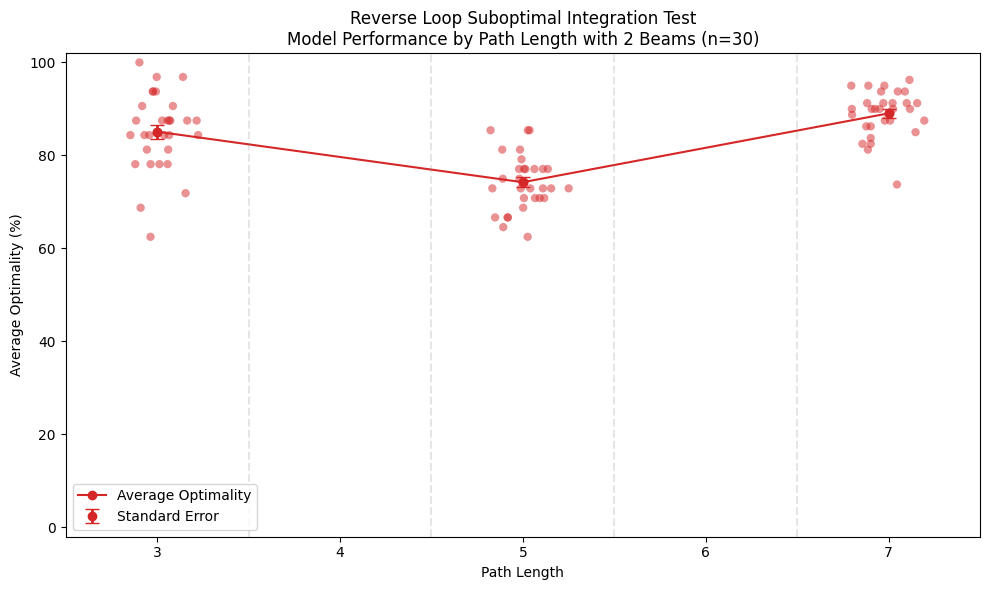

In [ ]:
test = "reverse_loop_suboptimal_integration"
num_beams = 2
size = 3

# Parent folder name
parent_folder = "reverse_loop_suboptimal_integration_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'path_length' and calculate the percentage of optimal outputs
    grouped = df.groupby('path_length')['optimality'].agg(
        average_optimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('path_length')['average_optimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['path_length'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Optimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['path_length'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['path_length']:
    data_points = summary_df[summary_df['path_length'] == step]['average_optimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Reverse Loop Suboptimal Integration Test\nModel Performance by Path Length with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Path Length')
plt.ylabel('Average Optimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['path_length'].min()
max_optimal_steps = grouped_stats['path_length'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [3.5, 4.5, 5.5, 6.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_performance_plot.png')
plt.savefig(save_path)
plt.show()

##### Reverse loop suboptimal integration test individual model output plots

In [ ]:
test_name = "Reverse Loop Suboptimal Integration Test"
test = "reverse_loop_suboptimal_integration"
num_beams = 2
parent_folder = "reverse_loop_suboptimal_integration_test"
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

selected_grid = "1"
selected_file = f"{directory_name}/{test}_{num_beams}beams_grid_{selected_grid}.csv"

# Call the function with the specific file path
plot_all_grid_files(selected_file, 'path')

Processing file: reverse_loop_suboptimal_integration_test/reverse_loop_suboptimal_integration_test_2beams/reverse_loop_suboptimal_integration_2beams_grid_1.csv, row 1: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1), (1, 1), (0, 1)]]
Processing file: reverse_loop_suboptimal_integration_test/reverse_loop_suboptimal_integration_test_2beams/reverse_loop_suboptimal_integration_2beams_grid_1.csv, row 2: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1), (1, 1), (1, 2), (0, 2), (0, 1)]]
Processing file: reverse_loop_suboptimal_integration_test/reverse_loop_suboptimal_integration_test_2beams/reverse_loop_suboptimal_integration_2beams_grid_1.csv, row 3: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1), (1, 1), (1, 2), (2, 2), (3, 2), (3, 3), (2, 3), (1, 3), (0, 3), (0, 2), (0, 1)]]
Processing file: reverse_loop_suboptimal_integration_test/reverse_loop_suboptimal_integration_test_2beams/reverse_loop_suboptimal_integration_2beams_grid_1.csv, row 4: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1), (2, 1

#### Reverse loop optimal integration test

In [ ]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

# Remember to load model with the desired hyperparameters before running this test!
# Can use batch size of 48 for Colab T4 GPU
size = 3  # Size (in terms of length) of the grid
test = "reverse_loop_optimal_integration"
num_grids = 30 # Number random grids to be tested

# Parent folder name
parent_folder = "reverse_loop_optimal_integration_test"

# Define folder name
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

loop_paths = generate_loop_paths(size)

# Create an empty DataFrame
path_permutation = pd.DataFrame(columns=['path'])

# Write all loop paths to the DataFrame
path_permutation['path'] = loop_paths

# Calculate path length for each loop path
path_permutation['path_length'] = path_permutation['path'].apply(lambda x: (len(x) - 1))

# Write start and end locations according to the first and last location of each loop path
path_permutation['end'] = path_permutation['path'].apply(lambda x: x[0])
path_permutation['start'] = path_permutation['path'].apply(lambda x: x[-1])

# Apply the connected_optimal_segments function to each row in the DataFrame
path_permutation['connected_segments'] = path_permutation['path'].apply(connected_optimal_segments)

# Create folder if the directory does not exist
if not os.path.exists(directory_name):
    # Create the directory
    os.makedirs(directory_name)

for n in range(num_grids):

    torch.cuda.empty_cache()
    gc.collect()

    # Generate a random grid of nouns
    nouns = set()
    while len(nouns) < size*size:
        word = Random_Word.word(include_parts_of_speech=["nouns"]).replace(" ", "_")
        nouns.add(word)
    nouns = list(nouns)

    # Generate grid from grid of nounds
    grid = create_unique_random_grid(nouns, size)

    path_permutations = path_permutation.copy()

    # Apply the generate_path_string function to each row in the DataFrame
    path_permutations['path_string'] = path_permutations['connected_segments'].apply(lambda x: generate_shortest_path_joining_string(grid, x))

    # Apply the adjusted append_target_path function to each row in the DataFrame
    path_permutations['input_prompt'] = path_permutations.apply(
        lambda row: copy_paste_append_target_path(
            row['path_string'],
            row['start'],
            row['end'],
            grid
        ),
        axis=1
    )

    # Batch generation of model outputs for the input prompts
    model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist(), batch_size)
    path_permutations['output'] = model_outputs

    # Serial generation of model outputs for the input prompts
    #model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist())
    #path_permutations['output'] = model_outputs

    # Apply the adjusted calculate_path_index function to each row in the DataFrame
    path_permutations['num_input'] = path_permutations['path_string'].apply(lambda x: calculate_path_index(x))

    # Apply the adjusted extract_path function to each row in the DataFrame
    path_permutations['extracted_output'] = path_permutations.apply(
        lambda row: extract_path(
            row['num_input'],
            row['output']
        ),
        axis=1
    )

    # Apply the adjusted path_to_coords function to each row in the DataFrame
    path_permutations['output_coords'] = path_permutations.apply(
        lambda row: direction_to_coords(
            row['extracted_output'],
            row['start'],
        ),
        axis=1
    )

    # Apply the adjusted calculate_optimal_steps function to each row in the DataFrame
    path_permutations['optimal_steps'] = path_permutations.apply(
        lambda row: calculate_optimal_steps(
            row['start'],
            row['end']
        ),
        axis=1
    )

    # Apply the adjusted calculate_generated_steps function to each row in the DataFrame
    path_permutations['generated_steps'] = path_permutations['output_coords'].apply(lambda x: calculate_generated_steps(x))

    # Check if the generated path is optimal for each row
    path_permutations['optimal_num_steps'] = path_permutations['optimal_steps'] == path_permutations['generated_steps']

    # Check if the extracted start and end points are same as the target start and end points
    path_permutations['start_end_validity'] = path_permutations.apply(
        lambda row: row['output_coords'][0] == row['start'] and row['output_coords'][-1] == row['end'],
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['optimality'] = path_permutations.apply(
        lambda row: all([row['optimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # write grid into path_permutations
    path_permutations['grid'] = [grid] * len(path_permutations)

    # Save the DataFrame to a CSV file
    save_path = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_{n+1}.csv')
    path_permutations.to_csv(save_path, index=False)

##### Reverse loop optimal integration test evaluation and performance plot

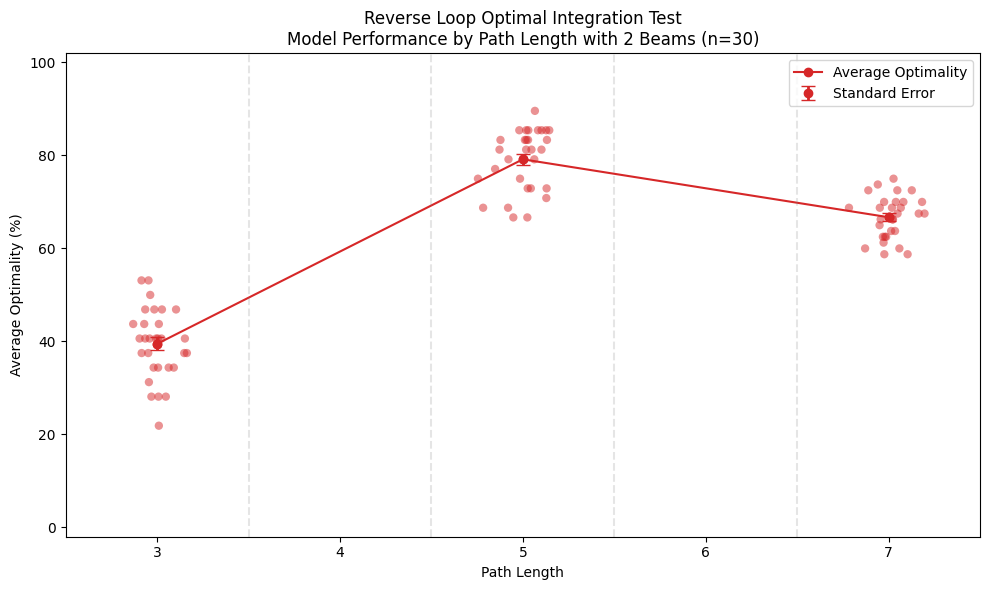

In [ ]:
test = "reverse_loop_optimal_integration"
num_beams = 2
size = 3

# Parent folder name
parent_folder = "reverse_loop_optimal_integration_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'path_length' and calculate the percentage of optimal outputs
    grouped = df.groupby('path_length')['optimality'].agg(
        average_optimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('path_length')['average_optimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['path_length'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Optimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['path_length'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['path_length']:
    data_points = summary_df[summary_df['path_length'] == step]['average_optimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Reverse Loop Optimal Integration Test\nModel Performance by Path Length with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Path Length')
plt.ylabel('Average Optimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['path_length'].min()
max_optimal_steps = grouped_stats['path_length'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [3.5, 4.5, 5.5, 6.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_performance_plot.png')
plt.savefig(save_path)
plt.show()

##### Reverse loop optimal integration test individual model output plots

In [ ]:
test_name = "Reverse Loop Optimal Integration Test"
test = "reverse_loop_optimal_integration"
num_beams = 2
parent_folder = "reverse_loop_optimal_integration_test"
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

selected_grid = "1"
selected_file = f"{directory_name}/{test}_{num_beams}beams_grid_{selected_grid}.csv"

# Call the function with the specific file path
plot_all_grid_files(selected_file, 'connected_segments')

Processing file: reverse_loop_optimal_integration_test/reverse_loop_optimal_integration_test_2beams/reverse_loop_optimal_integration_2beams_grid_1.csv, row 1: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1)], [(3, 1), (2, 1), (1, 1), (0, 1)]]
Processing file: reverse_loop_optimal_integration_test/reverse_loop_optimal_integration_test_2beams/reverse_loop_optimal_integration_2beams_grid_1.csv, row 2: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1)], [(3, 1), (2, 1), (1, 1), (1, 2), (0, 2)], [(0, 2), (0, 1)]]
Processing file: reverse_loop_optimal_integration_test/reverse_loop_optimal_integration_test_2beams/reverse_loop_optimal_integration_2beams_grid_1.csv, row 3: [[(0, 0), (1, 0), (2, 0), (3, 0), (3, 1)], [(3, 1), (2, 1), (1, 1), (1, 2)], [(1, 2), (2, 2), (3, 2), (3, 3)], [(3, 3), (2, 3), (1, 3), (0, 3), (0, 2), (0, 1)]]
Processing file: reverse_loop_optimal_integration_test/reverse_loop_optimal_integration_test_2beams/reverse_loop_optimal_integration_2beams_grid_1.csv, row 4: [[(0, 0), (1, 0), (2, 0

#### Missing location inference suboptimal path test

In [8]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

85

In [9]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

# Remember to load model with the desired hyperparameters before running this test!
# Can use batch size of 48 for Colab T4 GPU

size = 4  # Size (in terms of length) of the grid
test = "missing_location_inference_suboptimal"
num_grids = 3 # Number random grids to be tested
num_beams = 2

# Parent folder name
parent_folder = "missing_location_inference_suboptimal_test"

# Define folder name
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

path_permutation = generate_grid_paths(size)

# Create folder if the directory does not exist
if not os.path.exists(directory_name):
    # Create the directory
    os.makedirs(directory_name)

for n in range(num_grids):

    torch.cuda.empty_cache()
    gc.collect()

    # Generate a random grid of nouns
    nouns = set()
    while len(nouns) < size*size:
        word = Random_Word.word(include_parts_of_speech=["nouns"]).replace(" ", "_")
        nouns.add(word)
    nouns = list(nouns)

    # Generate grid from the set of nounds
    grid = create_unique_random_grid(nouns, size)

    path_permutations = path_permutation.copy()

    # Apply the generate_path_string function to each row in the DataFrame
    path_permutations['path_string'] = path_permutations['path'].apply(lambda x: generate_foraging_path_string(grid, x))

    # Apply the adjusted append_target_path function to each row in the DataFrame
    path_permutations['input_prompt'] = path_permutations.apply(
        lambda row: copy_paste_append_target_path(
            row['path_string'],
            row['start'],
            row['end'],
            grid
        ),
        axis=1
    )

    # Batch generation of model outputs for the input prompts
    model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist(), batch_size)
    path_permutations['output'] = model_outputs

    # Serial generation of model outputs for the input prompts
    #model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist())
    #path_permutations['output'] = model_outputs

    # Apply the adjusted calculate_path_index function to each row in the DataFrame
    path_permutations['num_input'] = path_permutations['path_string'].apply(lambda x: calculate_path_index(x))

    # Apply the adjusted extract_path function to each row in the DataFrame
    path_permutations['extracted_output'] = path_permutations.apply(
        lambda row: extract_path(
            row['num_input'],
            row['output']
        ),
        axis=1
    )

    # Apply the adjusted path_to_coords function to each row in the DataFrame
    path_permutations['output_coords'] = path_permutations.apply(
        lambda row: direction_to_coords(
            row['extracted_output'],
            row['start'],
        ),
        axis=1
    )

    # Apply the adjusted calculate_optimal_steps function to each row in the DataFrame
    path_permutations['optimal_steps'] = path_permutations.apply(
        lambda row: calculate_optimal_steps(
            row['start'],
            row['end']
        ),
        axis=1
    )

    # Apply the adjusted calculate_generated_steps function to each row in the DataFrame
    path_permutations['generated_steps'] = path_permutations['output_coords'].apply(lambda x: calculate_generated_steps(x))

    # Check if the generated path is optimal for each row
    path_permutations['optimal_num_steps'] = path_permutations['optimal_steps'] == path_permutations['generated_steps']

    # Check if the extracted start and end points are same as the target start and end points
    path_permutations['start_end_validity'] = path_permutations.apply(
        lambda row: row['output_coords'][0] == row['start'] and row['output_coords'][-1] == row['end'],
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['optimality'] = path_permutations.apply(
        lambda row: all([row['optimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # write grid into path_permutations
    path_permutations['grid'] = [grid] * len(path_permutations)

    # Save the DataFrame to a CSV file
    save_path = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_{n+1}.csv')
    path_permutations.to_csv(save_path, index=False)

##### Missing location inference suboptimal path test evaluation and performance plot

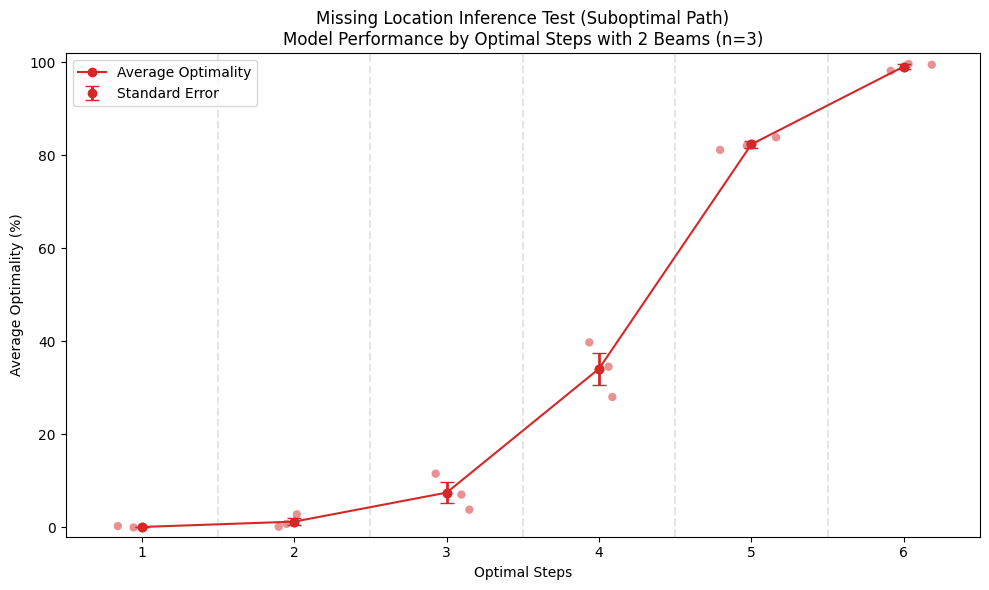

In [11]:
test = "missing_location_inference_suboptimal"
num_beams = 2
size = 4

# Parent folder name
parent_folder = "missing_location_inference_suboptimal_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'optimal_steps' and calculate the percentage of optimal outputs
    grouped = df.groupby('optimal_steps')['optimality'].agg(
        average_optimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('optimal_steps')['average_optimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['optimal_steps'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Optimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['optimal_steps'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['optimal_steps']:
    data_points = summary_df[summary_df['optimal_steps'] == step]['average_optimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Missing Location Inference Test (Suboptimal Path)\nModel Performance by Optimal Steps with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Optimal Steps')
plt.ylabel('Average Optimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['optimal_steps'].min()
max_optimal_steps = grouped_stats['optimal_steps'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5, 4.5, 5.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_performance_plot.png')
plt.savefig(save_path)
plt.show()

##### Missing location inference suboptimal path test individual model output plots

In [38]:
def plot_paths_on_grid(size, paths_coords, test_path_coords,
                       start_end_validity, is_valid_path, optimal_steps, test_path_steps, is_optimal, grid_num, generation, jitter_strength=0.3):
    fig, ax = plt.subplots(figsize=(size * 2, size * 2))
    plt.subplots_adjust(top=0.85)
    ax.set_xlim(0, size)
    ax.set_ylim(size, 0)

    # Draw grid lines
    for x in range(size + 1):
        ax.axvline(x, color='black', linestyle='-', linewidth=1)
    for y in range(size + 1):
        ax.axhline(y, color='black', linestyle='-', linewidth=1)

    # Plot predefined paths with collective jitter
    colors = ['tab:red', 'tab:orange', 'tab:green', 'tab:blue', 'tab:purple', 'tab:brown', 'tab:pink', 'tab:cyan', 'tab:olive', 'tab:gray']
    marker_style = dict(linestyle='-', linewidth=size/1.5, markersize=10)

    for i, path_coords in enumerate(paths_coords):
        # Filter out [None, None] coordinates
        filtered_path_coords = [coord for coord in path_coords if coord != [None, None]]

        # Apply the same jitter to the whole path
        jitter_x = np.random.uniform(-jitter_strength, jitter_strength)
        jitter_y = np.random.uniform(-jitter_strength, jitter_strength)
        jittered_path_coords = [(x + jitter_x, y + jitter_y) for x, y in filtered_path_coords]

        if jittered_path_coords:
            path_x, path_y = zip(*[(coord[1] + 0.5, coord[0] + 0.5) for coord in jittered_path_coords])
            ax.plot(path_x, path_y, colors[i % len(colors)], **marker_style)

            for j, (x, y) in enumerate(zip(path_x, path_y)):
                ax.plot(x, y, 'o', markersize=size*2.5, markeredgecolor='black', color=colors[i % len(colors)])
            if path_x != (None, None):
                txt = ax.text(path_x[0] + 0.08, path_y[0] + 0.08, 'S', ha='center', va='center', color=colors[i % len(colors)], fontsize=16 * (size / 5))
                txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='black')])
            if path_y != (None, None):
                txt = ax.text(path_x[-1] + 0.08, path_y[-1] + 0.08, 'E', ha='center', va='center', color=colors[i % len(colors)], fontsize=16 * (size / 5))
                txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='black')])

    # Plot the test_path_coords with individual visual indications for validity
    special_color = 'gold'
    jittered_test_path_coords = []

    for coord in test_path_coords:
        if coord != [None, None]:
            jittered_x = coord[1] + 0.5 + np.random.uniform(-jitter_strength, jitter_strength)
            jittered_y = coord[0] + 0.5 + np.random.uniform(-jitter_strength, jitter_strength)
            jittered_test_path_coords.append((jittered_x, jittered_y))
        else:
            jittered_test_path_coords.append((None, None))

    for i, (start, end) in enumerate(zip(jittered_test_path_coords[:-1], jittered_test_path_coords[1:])):
        if start == (None, None) or end == (None, None):
            continue  # Skip drawing if either point is invalid, but ensure it doesn't break continuity

        linestyle = '-'
        ax.plot([start[0], end[0]], [start[1], end[1]], color=special_color, linestyle=linestyle, linewidth=size/1.5, marker='*', markeredgecolor='black', markersize=size*4)

    # Plot the start ('S') and end ('E') markers with black edges
    if jittered_test_path_coords:
        start_coord = jittered_test_path_coords[0]
        end_coord = jittered_test_path_coords[-1]
        if start_coord != (None, None):
            txt = ax.text(start_coord[0] + 0.08, start_coord[1] + 0.08, 'S', ha='center', va='center',
                        color=special_color, fontsize=16 * (size / 5))
            txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='black')])
        if end_coord != (None, None):
            txt = ax.text(end_coord[0] + 0.08, end_coord[1] + 0.08, 'E', ha='center', va='center',
                        color=special_color, fontsize=16 * (size / 5))
            txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='black')])

    # Custom legend handles
    valid_line = mlines.Line2D([], [], color='gold', marker='*', linestyle='-', linewidth=1,
                               markersize=10, label='Model Output Sequence')
    invalid_line = mlines.Line2D([], [], color='gold', linestyle='--', linewidth=1,
                                 markersize=10, label='Invalid Steps')
    predefined_path = mlines.Line2D([], [], color='gray', marker='o', linestyle='-', linewidth=1,
                                    label='Conditioned Paths')

    # Add legend outside the plot area
    ax.legend(handles=[valid_line, invalid_line, predefined_path], loc='upper left', bbox_to_anchor=(1.15, 1))

    # Print additional info below the plot
    info_text_1 = f"Optimal steps: {optimal_steps}\n" \
                f"Generated path steps: {test_path_steps}\n\n"\

    fig.text(1.005, 0.7, info_text_1, ha='left', va='top', fontsize=5+size*2)

    info_text_2 = [
        ("Path Validity?", is_valid_path),
        ("Start-End Validity", start_end_validity),
        ("Path Optimality?", is_optimal)
    ]

    y_pos = 0.4
    for text, condition in info_text_2:
        color = 'green' if condition else 'red'
        condition_text = "True" if condition else "False"
        # Combine question and condition into one text element with conditional coloring
        full_text = f"{text}: {condition_text}"
        text_effect = [PathEffects.withStroke(linewidth=0.1, foreground="black")]  # Outline effect
        fig.text(1.005, y_pos, full_text, ha='left', va='top', fontsize=5+size*2,
                 color=color, path_effects=text_effect)
        y_pos -= 0.05  # Vertical spacing between lines

    ax.set_aspect('equal')
    ax.set_title(f"{test_name} Grid {grid_num} Path {generation}", pad=80 * (size / 5), fontsize=20 * (size / 5), loc='left')
    ax.xaxis.tick_top()
    ax.xaxis.set_label_position('top')
    ticks = np.arange(0.5, size, 1)
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(range(size))
    ax.set_yticklabels(range(size))
    ax.text(size/2, size + 0.2, 'EAST', ha='center', va='center', color='black', fontsize=20 * (size / 5))
    ax.text(size/2, -0.3, 'WEST', ha='center', va='center', color='black', fontsize=20 * (size / 5))
    ax.text(-0.3, size/2, 'NORTH', ha='center', va='center', color='black', fontsize=20 * (size / 5), rotation=90)
    ax.text(size + 0.2, size/2, 'SOUTH', ha='center', va='center', color='black', fontsize=20 * (size / 5), rotation=270)

def plot_all_grid_files(pattern, path_variable_name):
    from glob import glob
    import pandas as pd
    import ast
    import os
    import matplotlib.pyplot as plt

    # Get all files that match the pattern
    files = glob(pattern)

    # Iterate through each file
    for file_path in files:
        df = pd.read_csv(file_path)
        df['paths_coords'] = df[path_variable_name].apply(ast.literal_eval)  # Assuming 'path' column has a list of lists structure

        # Prepare a folder for saving plots based on the grid file name
        grid_folder_name = file_path.rsplit('.', 1)[0]  # Removes the file extension
        if not os.path.exists(grid_folder_name):
            os.makedirs(grid_folder_name)  # Create directory if it does not exist

        # Processing each row in DataFrame
        for index, row in df.iterrows():
            paths_coords = row['paths_coords']

            # Ensure paths_coords is a list of lists
            if not all(isinstance(path, list) for path in paths_coords):
                paths_coords = [paths_coords]  # Wrap it in another list if needed

            print(f"Processing file: {file_path}, row {index + 1}: {paths_coords}")

            grid_num = int(file_path.split('_')[-1].replace('.csv', ''))  # Extract grid number from file name

            plot_paths_on_grid(
                size=4,  # Example size, adjust accordingly
                paths_coords=paths_coords,
                test_path_coords=ast.literal_eval(row['output_coords']),
                start_end_validity=row.get('start_end_validity', "NA"),
                is_valid_path="NA",
                optimal_steps=row.get('optimal_steps', "NA"),
                test_path_steps=row.get('generated_steps', "NA"),
                is_optimal=row.get('optimality', "NA"),
                grid_num=grid_num,  # Extract grid number from file name
                generation=index + 1
            )

            # Save the plot to a file in the dedicated folder
            plt_filename = f"{grid_folder_name}/{test}_test_{num_beams}beams_grid_{grid_num}_path_{index + 1}.png"
            plt.savefig(plt_filename, bbox_inches='tight')
            plt.close()


In [40]:
test_name = "Missing Location Inference Test (Suboptimal Path)"
test = "missing_location_inference_suboptimal"
num_beams = 2
parent_folder = "missing_location_inference_suboptimal_test"
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

selected_grid = "1"
selected_file = f"{directory_name}/{test}_{num_beams}beams_grid_{selected_grid}.csv"

# Call the function with the specific file path
plot_all_grid_files(selected_file, 'path')

Processing file: missing_location_inference_suboptimal_test/missing_location_inference_suboptimal_test_2beams/missing_location_inference_suboptimal_2beams_grid_1.csv, row 1: [[(0, 1), (0, 2), (0, 3), (1, 3), (1, 2), (1, 1), (1, 0), (2, 0), (2, 1), (2, 2), (2, 3), (3, 3), (3, 2), (3, 1), (3, 0)]]
Processing file: missing_location_inference_suboptimal_test/missing_location_inference_suboptimal_test_2beams/missing_location_inference_suboptimal_2beams_grid_1.csv, row 2: [[(0, 1), (0, 2), (0, 3), (1, 3), (1, 2), (1, 1), (1, 0), (2, 0), (2, 1), (2, 2), (2, 3), (3, 3), (3, 2), (3, 1), (3, 0)]]
Processing file: missing_location_inference_suboptimal_test/missing_location_inference_suboptimal_test_2beams/missing_location_inference_suboptimal_2beams_grid_1.csv, row 3: [[(0, 1), (0, 2), (0, 3), (1, 3), (1, 2), (1, 1), (1, 0), (2, 0), (2, 1), (2, 2), (2, 3), (3, 3), (3, 2), (3, 1), (3, 0)]]
Processing file: missing_location_inference_suboptimal_test/missing_location_inference_suboptimal_test_2beams

#### Missing location inference optimlal segments test

In [ ]:
# Free unused memory
torch.cuda.empty_cache()
gc.collect()

# Remember to load model with the desired hyperparameters before running this test!
# Can use batch size of 48 for Colab T4 GPU

size = 4  # Size (in terms of length) of the grid
test = "missing_location_inference_optimal_segments"
num_grids = 30 # Number random grids to be tested
num_beams = 2

# Parent folder name
parent_folder = "missing_location_inference_optimal_segments_test"

# Define folder name
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

path_permutation = generate_grid_paths(size)

# Apply the connected_optimal_segments function to each row in the DataFrame
path_permutation['connected_segments'] = path_permutation['path'].apply(connected_optimal_segments)

# Create folder if the directory does not exist
if not os.path.exists(directory_name):
    # Create the directory
    os.makedirs(directory_name)

for n in range(num_grids):

    torch.cuda.empty_cache()
    gc.collect()

    # Generate a random grid of nouns
    nouns = set()
    while len(nouns) < size*size:
        word = Random_Word.word(include_parts_of_speech=["nouns"]).replace(" ", "_")
        nouns.add(word)
    nouns = list(nouns)

    # Generate grid from the set of nounds
    grid = create_unique_random_grid(nouns, size)

    path_permutations = path_permutation.copy()

    # Apply the generate_path_string function to each row in the DataFrame
    path_permutations['path_string'] = path_permutations['path'].apply(lambda x: generate_foraging_path_string(grid, x))

    # Apply the adjusted append_target_path function to each row in the DataFrame
    path_permutations['input_prompt'] = path_permutations.apply(
        lambda row: copy_paste_append_target_path(
            row['path_string'],
            row['start'],
            row['end'],
            grid
        ),
        axis=1
    )

    # Batch generation of model outputs for the input prompts
    model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist(), batch_size)
    path_permutations['output'] = model_outputs

    # Serial generation of model outputs for the input prompts
    #model_outputs = generate_model_outputs(model, path_permutations['input_prompt'].tolist())
    #path_permutations['output'] = model_outputs

    # Apply the adjusted calculate_path_index function to each row in the DataFrame
    path_permutations['num_input'] = path_permutations['path_string'].apply(lambda x: calculate_path_index(x))

    # Apply the adjusted extract_path function to each row in the DataFrame
    path_permutations['extracted_output'] = path_permutations.apply(
        lambda row: extract_path(
            row['num_input'],
            row['output']
        ),
        axis=1
    )

    # Apply the adjusted path_to_coords function to each row in the DataFrame
    path_permutations['output_coords'] = path_permutations.apply(
        lambda row: direction_to_coords(
            row['extracted_output'],
            row['start'],
        ),
        axis=1
    )

    # Apply the adjusted calculate_optimal_steps function to each row in the DataFrame
    path_permutations['optimal_steps'] = path_permutations.apply(
        lambda row: calculate_optimal_steps(
            row['start'],
            row['end']
        ),
        axis=1
    )

    # Apply the adjusted calculate_generated_steps function to each row in the DataFrame
    path_permutations['generated_steps'] = path_permutations['output_coords'].apply(lambda x: calculate_generated_steps(x))

    # Check if the generated path is optimal for each row
    path_permutations['optimal_num_steps'] = path_permutations['optimal_steps'] == path_permutations['generated_steps']

    # Check if the extracted start and end points are same as the target start and end points
    path_permutations['start_end_validity'] = path_permutations.apply(
        lambda row: row['output_coords'][0] == row['start'] and row['output_coords'][-1] == row['end'],
        axis=1
    )

    # Check if the generated path is both valid and optimal
    path_permutations['optimality'] = path_permutations.apply(
        lambda row: all([row['optimal_num_steps'], row['start_end_validity']]),
        axis=1
    )

    # write grid into path_permutations
    path_permutations['grid'] = [grid] * len(path_permutations)

    # Save the DataFrame to a CSV file
    save_path = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_{n+1}.csv')
    path_permutations.to_csv(save_path, index=False)

##### Missing location inference optimal segments test evaluation and performance plot

In [ ]:
test = "missing_location_inference_optimal_segments"
num_beams = 2
size = 4

# Parent folder name
parent_folder = "missing_location_inference_optimal_segments_test"

# Define directory_name before using it
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# List to hold the summary data
summary_data = []

# Pattern to match specific .csv files format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Use glob to find all .csv files in the directory matching the pattern
csv_files = glob.glob(pattern)

# Loop through each file in the directory
for file_path in csv_files:
    df = pd.read_csv(file_path)

    # Extract grid_number from file_name
    file_name = os.path.basename(file_path)
    n = int(file_name.split('_')[-1].split('.')[0])  # Assuming the format ends with _n.csv

    # Group by 'optimal_steps' and calculate the percentage of optimal outputs
    grouped = df.groupby('optimal_steps')['optimality'].agg(
        average_optimality=lambda x: (x.sum() / len(x)) * 100
    ).reset_index()
    grouped['num_beams'] = num_beams
    grouped['grid_number'] = n
    summary_data.append(grouped)

# Combine all data into a single DataFrame
summary_df = pd.concat(summary_data, ignore_index=True)

# Save summary table to a CSV in the directory folder
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_summary.csv')
summary_df.to_csv(save_path, index=False)

grouped_stats = summary_df.groupby('optimal_steps')['average_optimality'].agg(['mean', 'sem']).reset_index()

plt.figure(figsize=(10, 6))

# Plotting the line for mean values
plt.plot(grouped_stats['optimal_steps'], grouped_stats['mean'], marker='o', linestyle='-', color='tab:red', label='Average Optimality')

# Adding error bars for the standard error
plt.errorbar(grouped_stats['optimal_steps'], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt='o', color='tab:red', ecolor='tab:red', elinewidth=2, capsize=5, label='Standard Error')

# Iterate through each group and plot individual data points
# Adjust the 'position' to avoid overlapping too much with the mean line
for step in grouped_stats['optimal_steps']:
    data_points = summary_df[summary_df['optimal_steps'] == step]['average_optimality']
    # Spread out data points horizontally and avoid overlap
    jitter = np.random.normal(scale=0.1, size=len(data_points))
    plt.scatter([step + jitter], data_points, alpha=0.5, color='tab:red', edgecolor='none')
# Count the number of grids
summary_num_grids = len(csv_files)

plt.title(f'Missing Location Inference Optimal Segments Test\nModel Performance by Optimal Steps with {num_beams} Beams (n={summary_num_grids})')
plt.xlabel('Optimal Steps')
plt.ylabel('Average Optimality (%)')
plt.legend()

min_optimal_steps = grouped_stats['optimal_steps'].min()
max_optimal_steps = grouped_stats['optimal_steps'].max()
plt.xticks(range(min_optimal_steps, max_optimal_steps + 1))
plt.xlim(min_optimal_steps - 0.5, max_optimal_steps + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
save_path = os.path.join(directory_name, f'{test}_test_{num_beams}beams_performance_plot.png')
plt.savefig(save_path)
plt.show()

##### Missing location inference optimal segments test individual model output plots

In [ ]:
test_name = "Missing Location Inference Optimal Segments Test"
test = "missing_location_inference_optimal_segments"
num_beams = 2
parent_folder = "missing_location_inference_optimal_segments_test"
directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

selected_grid = "1"
selected_file = f"{directory_name}/{test}_{num_beams}beams_grid_{selected_grid}.csv"

# Call the function with the specific file path
plot_all_grid_files(selected_file, 'connected_segments')

### Plot model performance

#### Model performance across tests at num_beam=2

Summary file for reverse_path_joining not found in reverse_path_joining_test/reverse_path_joining_test_2beams/reverse_path_joining_test_2beams_summary.csv


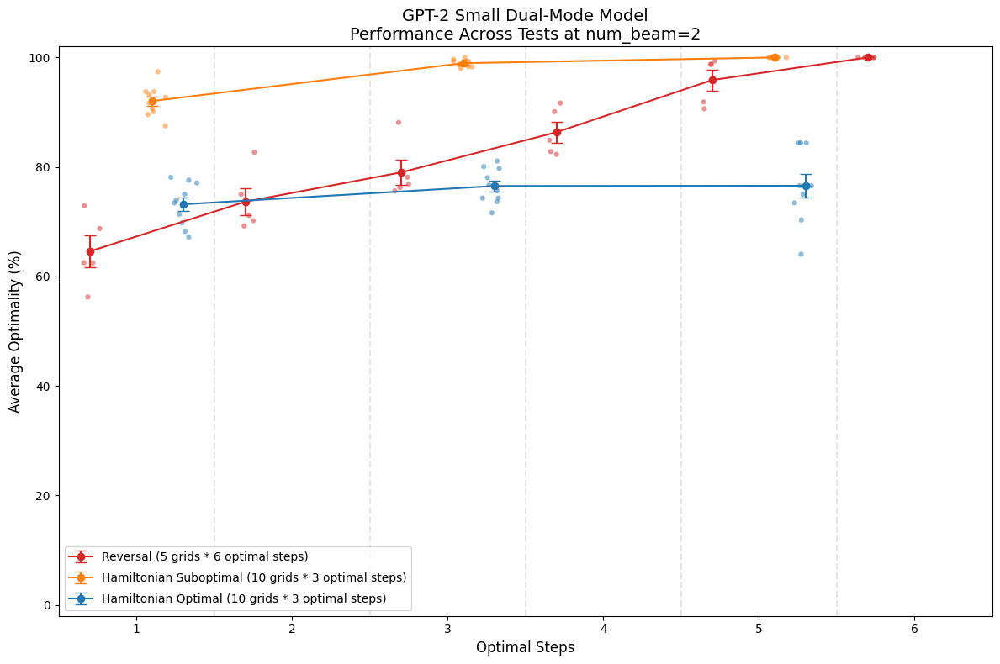

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# Model and test parameters to be plotted
num_beams = 2
size = 3

# Define tests, their respective parent folder names, and associated colors for the plot
tests_info = [
    ("Reversal", "reversal", "reversal_test", "tab:red", "o-"),
    ("Reverse Path Joining", "reverse_path_joining", "reverse_path_joining_test", "tab:green", "o-"),
    ("Hamiltonian Suboptimal", "hamiltonian_suboptimal", "hamiltonian_suboptimal_test", "tab:orange", "o-"),
    ("Hamiltonian Optimal", "hamiltonian_optimal_segments", "hamiltonian_optimal_segments_test", "tab:blue", "o-"),
]

# Base horizontal offset values to reduce overlap
base_offsets = np.linspace(-0.3, 0.3, len(tests_info))

# Initialize an empty DataFrame to store all summary data
all_summary_data = pd.DataFrame()

# Loop through each test, read the summary data, and append it to the all_summary_data DataFrame
for _, test, parent_folder, color, fmt in tests_info:
    summary_csv_path = os.path.join(parent_folder,
        f'{test}_test_{num_beams}beams/{test}_test_{num_beams}beams_summary.csv')
    if os.path.exists(summary_csv_path):
        df = pd.read_csv(summary_csv_path)
        df['test'] = test  # Add a column to identify the test
        all_summary_data = pd.concat([all_summary_data, df], ignore_index=True)
    else:
        print(f"Summary file for {test} not found in {summary_csv_path}")

# Save the combined DataFrame to a CSV file
combined_summary_path = f'combined_tests_summary_{num_beams}beams.csv'
all_summary_data.to_csv(combined_summary_path, index=False)

# Now plot the data
plt.figure(figsize=(12, 8))

for i, (test_name, test, _, color, fmt) in enumerate(tests_info):
    test_data = all_summary_data[all_summary_data['test'] == test]
    if not test_data.empty:
        marker = fmt[0]  # Extract marker style
        linestyle = fmt[1:]  # Extract line style
        grouped_stats = test_data.groupby('optimal_steps')['average_optimality'].agg(['mean', 'sem']).reset_index()
        data_count = len(test_data)//len(grouped_stats['optimal_steps'])
        optimal_steps_count = len(grouped_stats['optimal_steps'])
        plt.errorbar(grouped_stats['optimal_steps'] + base_offsets[i], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt=fmt,
                     color=color, label=f'{test_name} ({data_count} grids * {optimal_steps_count} optimal steps)', capsize=5)

        # Plot individual data points with jitter and horizontal offset for each group
        for step in grouped_stats['optimal_steps']:
            step_data = test_data[test_data['optimal_steps'] == step]['average_optimality']
            jittered_x = np.random.normal(step + base_offsets[i], 0.04, size=len(step_data))
            plt.scatter(jittered_x, step_data, marker=marker, alpha=0.5, color=color, edgecolor='none', s=20)

plt.title(f'GPT-2 Small Dual-Mode Model\nPerformance Across Tests at num_beam={num_beams}', fontsize=14)
plt.xlabel('Optimal Steps', fontsize=12)
plt.ylabel('Average Optimality (%)', fontsize=12)
plt.legend(labelspacing=0.8)

# Adjusting the x- and y-axis
optimal_steps_range = range(int(all_summary_data['optimal_steps'].min()), int(all_summary_data['optimal_steps'].max()) + 1)
plt.xticks(optimal_steps_range)
plt.xlim(int(all_summary_data['optimal_steps'].min()) - 0.5, int(all_summary_data['optimal_steps'].max()) + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5, 4.5, 5.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
plt.savefig(f'combined_tests_performance_{num_beams}beams.png')
plt.show()


#### Model performance across loop tests at num_beam=2

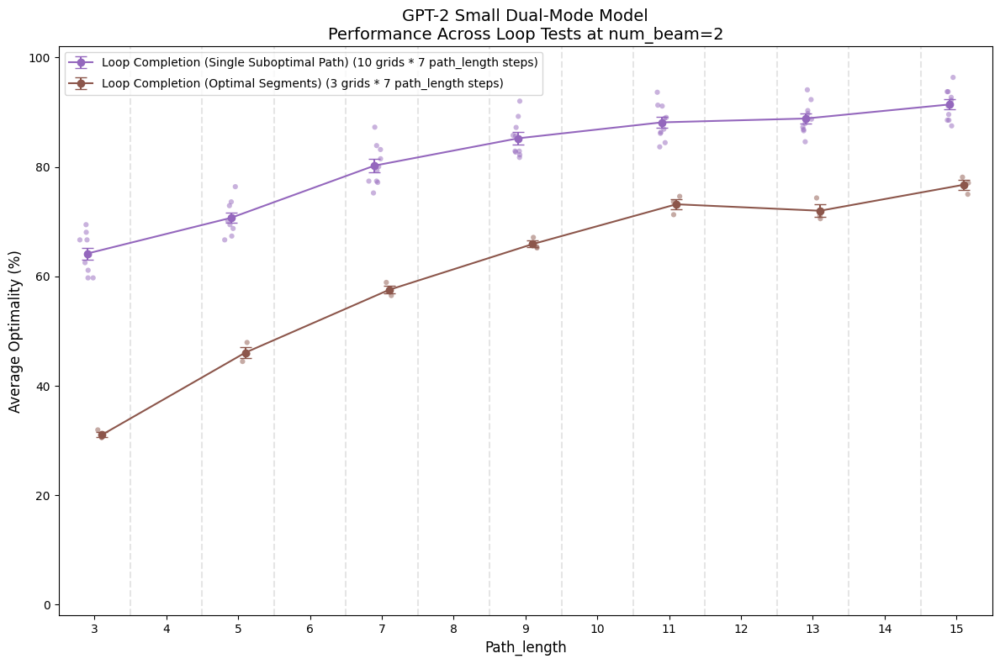

In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# Model and test parameters to be plotted
num_beams = 2
size = 3

# Define tests, their respective parent folder names, and associated colors for the plot
tests_info = [
    ("Loop Completion (Single Suboptimal Path)", "reverse_loop_suboptimal_integration", "reverse_loop_suboptimal_integration_test", "tab:purple", "o-"),
    ("Loop Completion (Optimal Segments)", "reverse_loop_optimal_integration", "reverse_loop_optimal_integration_test", "tab:brown", "o-"),
]

# Base horizontal offset values to reduce overlap
base_offsets = np.linspace(-0.1, 0.1, len(tests_info))

# Initialize an empty DataFrame to store all summary data
all_summary_data = pd.DataFrame()

# Loop through each test, read the summary data, and append it to the all_summary_data DataFrame
for _, test, parent_folder, color, fmt in tests_info:
    summary_csv_path = os.path.join(parent_folder,
        f'{test}_test_{num_beams}beams/{test}_test_{num_beams}beams_summary.csv')
    if os.path.exists(summary_csv_path):
        df = pd.read_csv(summary_csv_path)
        df['test'] = test  # Add a column to identify the test
        all_summary_data = pd.concat([all_summary_data, df], ignore_index=True)
    else:
        print(f"Summary file for {test} not found in {summary_csv_path}")

# Save the combined DataFrame to a CSV file
combined_summary_path = f'combined_loop_integration_summary_{num_beams}beams.csv'
all_summary_data.to_csv(combined_summary_path, index=False)

# Now plot the data
plt.figure(figsize=(12, 8))

for i, (test_name, test, _, color, fmt) in enumerate(tests_info):
    test_data = all_summary_data[all_summary_data['test'] == test]
    if not test_data.empty:
        marker = fmt[0]  # Extract marker style
        linestyle = fmt[1:]  # Extract line style
        grouped_stats = test_data.groupby('path_length')['average_optimality'].agg(['mean', 'sem']).reset_index()
        data_count = len(test_data)//len(grouped_stats['path_length'])
        optimal_steps_count = len(grouped_stats['path_length'])
        plt.errorbar(grouped_stats['path_length'] + base_offsets[i], grouped_stats['mean'], yerr=grouped_stats['sem'], fmt=fmt,
                     color=color, label=f'{test_name} ({data_count} grids * {optimal_steps_count} path_length steps)', capsize=5)

        # Plot individual data points with jitter and horizontal offset for each group
        for step in grouped_stats['path_length']:
            step_data = test_data[test_data['path_length'] == step]['average_optimality']
            jittered_x = np.random.normal(step + base_offsets[i], 0.04, size=len(step_data))
            plt.scatter(jittered_x, step_data, marker=marker, alpha=0.5, color=color, edgecolor='none', s=20)

plt.title(f'GPT-2 Small Dual-Mode Model\nPerformance Across Loop Tests at num_beam={num_beams}', fontsize=14)
plt.xlabel('Path_length', fontsize=12)
plt.ylabel('Average Optimality (%)', fontsize=12)
plt.legend(labelspacing=0.8)

# Adjusting the x- and y-axis
optimal_steps_range = range(int(all_summary_data['path_length'].min()), int(all_summary_data['path_length'].max()) + 1)
plt.xticks(optimal_steps_range)
plt.xlim(int(all_summary_data['path_length'].min()) - 0.5, int(all_summary_data['path_length'].max()) + 0.5)
# Add vertical gridlines
for position in [3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5, 10.5, 11.5, 12.5, 13.5, 14.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
plt.savefig(f'combined_loop_integration_performance_{num_beams}beams.png')
plt.show()


#### Performance comparison with Shortest-Only Model across tests

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directories for the two models
dual_mode_dir = "/Users/leowong/Desktop/Modelling Spatial Navigation/gpt2medium_foraging_shortest_interleaved_dual_mode_2000"
shortest_mode_dir = "/Users/leowong/Desktop/Modelling Spatial Navigation/gpt2medium_shortest_mode_only_2000"

# Model and test parameters to be plotted
num_beams = 2

# Define tests, their respective parent folder names, and associated colors for the plot
tests_info = [
    ("Reversal", "reversal", "reversal_test", "tab:red"),
    ("Reverse Path Joining", "reverse_path_joining", "reverse_path_joining_test", "tab:green"),
    ("Hamiltonian Suboptimal Integration", "hamiltonian_suboptimal", "hamiltonian_suboptimal_test", "tab:orange"),
    ("Hamiltonian Optimal Integration", "hamiltonian_optimal_segments", "hamiltonian_optimal_segments_test", "tab:blue"),
]

# Base horizontal offset values to reduce overlap
base_offsets = np.linspace(-0.3, 0.3, len(tests_info))

# Function to read and combine summary data from a given directory
def read_and_combine_data(model_dir, model_name):
    all_summary_data = pd.DataFrame()
    for _, test, parent_folder, color in tests_info:
        summary_csv_path = os.path.join(model_dir, parent_folder,
            f'{test}_test_{num_beams}beams/{test}_test_{num_beams}beams_summary.csv')
        if os.path.exists(summary_csv_path):
            df = pd.read_csv(summary_csv_path)
            df['test'] = test  # Add a column to identify the test
            df['model'] = model_name  # Add a column to identify the model
            all_summary_data = pd.concat([all_summary_data, df], ignore_index=True)
        else:
            print(f"Summary file for {test} not found in {summary_csv_path}")
    return all_summary_data

# Read and combine data for both models
dual_mode_data = read_and_combine_data(dual_mode_dir, 'Dual-Mode')
shortest_mode_data = read_and_combine_data(shortest_mode_dir, 'Shortest-Mode')

# Combine data from both models
combined_data = pd.concat([dual_mode_data, shortest_mode_data], ignore_index=True)

# Save the combined DataFrame to a CSV file
combined_summary_path = f'combined_tests_summary_{num_beams}beams_comparison.csv'
combined_data.to_csv(combined_summary_path, index=False)

# Now plot the data
plt.figure(figsize=(12, 8))

for i, (test_name, test, _, color) in enumerate(tests_info):
    for model_name, linestyle, marker in zip(['Dual-Mode', 'Shortest-Mode'], ['-', '--'], ['o', 'x']):
        model_data = combined_data[(combined_data['test'] == test) & (combined_data['model'] == model_name)]
        if not model_data.empty:
            grouped_stats = model_data.groupby('optimal_steps')['average_optimality'].agg(['mean', 'sem']).reset_index()
            data_count = len(model_data)//len(grouped_stats['optimal_steps'])
            optimal_steps_count = len(grouped_stats['optimal_steps'])
            plt.errorbar(grouped_stats['optimal_steps'] + base_offsets[i], grouped_stats['mean'], yerr=grouped_stats['sem'],
                         fmt=marker + linestyle, color=color, label=f'{test_name} ({model_name}) ({data_count} grids * {optimal_steps_count} optimal steps)', capsize=5)

plt.title(f'GPT-2 Medium Model Comparison\nPerformance Across Tests at num_beam={num_beams}', fontsize=14)
plt.xlabel('Optimal Steps', fontsize=12)
plt.ylabel('Average Optimality (%)', fontsize=12)
plt.legend(labelspacing=0.8)

# Adjusting the x- and y-axis
optimal_steps_range = range(int(combined_data['optimal_steps'].min()), int(combined_data['optimal_steps'].max()) + 1)
plt.xticks(optimal_steps_range)
plt.xlim(int(combined_data['optimal_steps'].min()) - 0.5, int(combined_data['optimal_steps'].max()) + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
plt.savefig(f'combined_tests_performance_comparison_{num_beams}beams.png')
plt.show()


#### Performance comparison with Shortest-Only Model across loop integration tests

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directories for the two models
dual_mode_dir = "/Users/leowong/Desktop/Modelling Spatial Navigation/gpt2medium_foraging_shortest_interleaved_dual_mode_2000"
shortest_mode_dir = "/Users/leowong/Desktop/Modelling Spatial Navigation/gpt2medium_shortest_mode_only_2000"

# Model and test parameters to be plotted
num_beams = 2

# Define tests, their respective parent folder names, and associated colors for the plot
tests_info = [
    ("Reveres Loop Suboptimal Integration", "reverse_loop_suboptimal_integration", "reverse_loop_suboptimal_integration_test", "tab:purple"),
    ("Reveres Loop Optimal Integration", "reverse_loop_optimal_integration", "reverse_loop_optimal_integration_test", "tab:brown"),
]

# Base horizontal offset values to reduce overlap
base_offsets = np.linspace(-0.1, 0.1, len(tests_info))

# Function to read and combine summary data from a given directory
def read_and_combine_data(model_dir, model_name):
    all_summary_data = pd.DataFrame()
    for _, test, parent_folder, color in tests_info:
        summary_csv_path = os.path.join(model_dir, parent_folder,
            f'{test}_test_{num_beams}beams/{test}_test_{num_beams}beams_summary.csv')
        if os.path.exists(summary_csv_path):
            df = pd.read_csv(summary_csv_path)
            df['test'] = test  # Add a column to identify the test
            df['model'] = model_name  # Add a column to identify the model
            all_summary_data = pd.concat([all_summary_data, df], ignore_index=True)
        else:
            print(f"Summary file for {test} not found in {summary_csv_path}")
    return all_summary_data

# Read and combine data for both models
dual_mode_data = read_and_combine_data(dual_mode_dir, 'Dual-Mode')
shortest_mode_data = read_and_combine_data(shortest_mode_dir, 'Shortest-Mode')

# Combine data from both models
combined_data = pd.concat([dual_mode_data, shortest_mode_data], ignore_index=True)

# Save the combined DataFrame to a CSV file
combined_summary_path = f'combined_loop_integration_summary_{num_beams}beams_comparison.csv'
combined_data.to_csv(combined_summary_path, index=False)

# Now plot the data
plt.figure(figsize=(12, 8))

for i, (test_name, test, _, color) in enumerate(tests_info):
    for model_name, linestyle, marker in zip(['Dual-Mode', 'Shortest-Mode'], ['-', '--'], ['o', 'x']):
        model_data = combined_data[(combined_data['test'] == test) & (combined_data['model'] == model_name)]
        if not model_data.empty:
            grouped_stats = model_data.groupby('path_length')['average_optimality'].agg(['mean', 'sem']).reset_index()
            data_count = len(model_data)//len(grouped_stats['path_length'])
            path_length_count = len(grouped_stats['path_length'])
            plt.errorbar(grouped_stats['path_length'] + base_offsets[i], grouped_stats['mean'], yerr=grouped_stats['sem'],
                         fmt=marker + linestyle, color=color, label=f'{test_name} ({model_name}) ({data_count} grids * {path_length_count} path lengths)', capsize=5)

plt.title(f'GPT-2 Medium Model Comparison\nPerformance Across Loop Tests at num_beam={num_beams}', fontsize=14)
plt.xlabel('Path Length', fontsize=12)
plt.ylabel('Average Optimality (%)', fontsize=12)
plt.legend(labelspacing=0.8)

# Adjusting the x- and y-axis
path_length_range = range(int(combined_data['path_length'].min()), int(combined_data['path_length'].max()) + 1)
plt.xticks(path_length_range)
plt.xlim(int(combined_data['path_length'].min()) - 0.5, int(combined_data['path_length'].max()) + 0.5)
# Add vertical gridlines
for position in [1.5, 2.5, 3.5]:
    plt.axvline(x=position, color='gray', linestyle='--', alpha=0.2)
plt.ylim(-2, 102)

plt.tight_layout()
plt.savefig(f'combined_loop_integration_performance_comparison_{num_beams}beams.png')
plt.show()


### Function for renaming files and folder names

In [ ]:
import os
import glob

test = "reverse_hamiltonian_optimal"
num_beams = 2
size = 4

parent_folder = "reverse_hamiltonian_optimal_test"

directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# Pattern to match files with the 'incorrect' format
pattern = os.path.join(directory_name, f'{test}_{num_beams}beams_grid_*.csv')

# Find all files matching the pattern
csv_files = glob.glob(pattern)

# Loop through the found csv files to rename
for old_file in csv_files:
    # Extract part of the original filename after the directory name
    base_name = os.path.basename(old_file)

    # Create a new filename by replacing the middle segment of the filename
    new_base_name = base_name.replace(f'hamiltonian_optimal', f'hamiltonian_optimal_segments')

    # Construct full path for the new filename
    new_file = os.path.join(directory_name, new_base_name)

    # Rename the file
    os.rename(old_file, new_file)
    print(f"Renamed '{old_file}' to '{new_file}'")

# Rename the directory as well
# Define the old directory name
old_directory_name = f"{parent_folder}/{test}_test_{num_beams}beams"

# Define the new directory name
new_directory_name = f"{parent_folder}/{test}_segments_test_{num_beams}beams"

# Check if the new directory name already exists to avoid overwriting existing data
if not os.path.exists(new_directory_name):
    # Rename the directory
    os.rename(old_directory_name, new_directory_name)
    print(f"Renamed directory from '{old_directory_name}' to '{new_directory_name}'")
else:
    print(f"The directory '{new_directory_name}' already exists.")

# Rename the parent folder as well
# Define the old parent folder name
old_parent_folder = "reverse_hamiltonian_optimal_test"
new_parent_folder = "reverse_hamiltonian_optimal_segments_test"

# Check if the new parent folder name already exists to avoid overwriting existing data
if not os.path.exists(new_parent_folder):
    # Rename the parent folder
    os.rename(old_parent_folder, new_parent_folder)
    print(f"Renamed parent folder from '{old_parent_folder}' to '{new_parent_folder}'")
else:
    print(f"The parent folder '{new_parent_folder}' already exists.")

Renamed 'reverse_hamiltonian_optimal_test/reverse_hamiltonian_optimal_test_2beams/reverse_hamiltonian_optimal_2beams_grid_23.csv' to 'reverse_hamiltonian_optimal_test/reverse_hamiltonian_optimal_test_2beams/reverse_hamiltonian_optimal_segments_2beams_grid_23.csv'
Renamed 'reverse_hamiltonian_optimal_test/reverse_hamiltonian_optimal_test_2beams/reverse_hamiltonian_optimal_2beams_grid_22.csv' to 'reverse_hamiltonian_optimal_test/reverse_hamiltonian_optimal_test_2beams/reverse_hamiltonian_optimal_segments_2beams_grid_22.csv'
Renamed 'reverse_hamiltonian_optimal_test/reverse_hamiltonian_optimal_test_2beams/reverse_hamiltonian_optimal_2beams_grid_20.csv' to 'reverse_hamiltonian_optimal_test/reverse_hamiltonian_optimal_test_2beams/reverse_hamiltonian_optimal_segments_2beams_grid_20.csv'
Renamed 'reverse_hamiltonian_optimal_test/reverse_hamiltonian_optimal_test_2beams/reverse_hamiltonian_optimal_2beams_grid_21.csv' to 'reverse_hamiltonian_optimal_test/reverse_hamiltonian_optimal_test_2beams/r

### Scheduled testing